In [1]:
import autoviz

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [3]:
from autoviz import AutoViz_Class

In [4]:
av=AutoViz_Class()

In [5]:
data=[]
for i in range(2007,2023):
    df=pd.read_csv(f"The Hollywood Inider - all data - {i}.csv")
    data.append(df)

In [6]:
df=pd.concat(data,ignore_index=True)
df.head()

,Film,Year,Script Type,Rotten Tomatoes critics,Metacritic critics,Average critics,Rotten Tomatoes Audience,Metacritic Audience,Rotten Tomatoes vs Metacritic deviance,Average audience,Audience vs Critics deviance,Primary Genre,Genre,Opening Weekend,Opening weekend ($million),Domestic Gross,Domestic gross ($million),Foreign Gross ($million),Foreign Gross,Worldwide Gross,Worldwide Gross ($million),of Gross earned abroad,Budget ($million),Budget recovered,Budget recovered opening weekend,Oscar Winners,Oscar Detail,Link,None,Distributor,IMDb Rating,IMDB vs RT disparity,Release Date (US),"financial source, if not The numbers",Genres,Opening Weekend ($),% of Gross earned abroad,Budget recovered,Budget recovered opening weekend,Film list here: https://www.boxofficemojo.com/year/2019/?ref_=bo_yl_table_5,Film list here: https://www.boxofficemojo.com/year/2020/?grossesOption=calendarGrosses,Film list here: https://www.boxofficemojo.com/year/2021/,film list here https://www.boxofficemojo.com/year/2022/
0,300,2007,adaptation,60,51,56,89.0,71,18,80,-25,action,"period, action",70885301,70.89,210614939,210.61,245.45,245453242,456068181,456,53.82%,65,701.64%,109.05%,NaN,NaN,http://www.amazon.co.uk/dp/B00EU7O4D8?ref_=imdbref_tt_wbr_aiv&tag=imdbtag_tt_wbr_aiv-21,NaN,NaN,NaN,NaN,"Mar 9, 2007",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3:10 to Yuma,2007,remake,88,76,82,86.0,73,13,80,3,western,western,14035033,14.04,53606916,53.61,16.17,16173815,69780731,70,23.18%,50,139.56%,28.07%,NaN,NaN,http://www.amazon.co.uk/dp/B00I2CX91A?ref_=imdbref_tt_wbr_aiv&tag=imdbtag_tt_wbr_aiv-21,NaN,NaN,NaN,NaN,"Sep 7, 2007",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,30 Days of Night,2007,adaptation,50,53,52,56.0,65,-9,61,-9,horror,horror,15951902,15.95,39568996,39.57,35.53,35526091,75095087,75,47.31%,32,234.67%,49.85%,NaN,NaN,http://www.amazon.co.uk/30-Days-night-Josh-Hartnett/dp/B00FYN9UZO/ref=sr_1_1?s=instant-video&ie=UTF8&qid=1457385592&sr=1-1&keywords=30+Days+of+Night,NaN,NaN,NaN,NaN,"Oct 19, 2007",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Across the Universe,2007,original screenplay,54,56,55,82.0,73,9,78,-23,musical,musical,3824988,3.82,24343673,24.34,5.02,5023470,29367143,29,17.11%,45,65.26%,8.50%,NaN,NaN,http://www.amazon.co.uk/Across-Universe-Sturgess-Evan-Rachel/dp/B00I3R3PNQ/ref=sr_1_1?s=instant-video&ie=UTF8&qid=1457385603&sr=1-1&keywords=Across+the+Universe,NaN,NaN,NaN,NaN,"Oct 12, 2007",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Alien vs. Predator - Requiem,2007,sequel,14,29,22,31.0,45,-14,38,-17,sci-fi,"sci-fi, horror",10059425,10.06,41797066,41.8,87.09,87086650,128883716,129,67.57%,40,322.21%,25.15%,NaN,NaN,http://www.amazon.co.uk/Aliens-Vs-Predator-John-Ortiz/dp/B00FYJ2744/ref=sr_1_sc_1?s=instant-video&ie=UTF8&qid=1457385617&sr=1-1-spell&keywords=AAlien+vs.+Predator+-+Requiem,NaN,NaN,NaN,NaN,"Dec 25, 2007",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1967 entries, 0 to 1966
Data columns (total 43 columns):
 #   Column                                                                                  Non-Null Count  Dtype  
---  ------                                                                                  --------------  -----  
 0   Film                                                                                    1967 non-null   object 
 1   Year                                                                                    1967 non-null   int64  
 2   Script Type                                                                             1774 non-null   object 
 3   Rotten Tomatoes  critics                                                                1966 non-null   object 
 4   Metacritic  critics                                                                     1967 non-null   object 
 5   Average critics                                                      

In [8]:
(df.isnull().sum()/1967)*100

Film                                                                                        0.000000
Year                                                                                        0.000000
Script Type                                                                                 9.811896
Rotten Tomatoes  critics                                                                    0.050839
Metacritic  critics                                                                         0.000000
Average critics                                                                             0.000000
Rotten Tomatoes Audience                                                                    0.050839
Metacritic Audience                                                                         0.000000
Rotten Tomatoes vs Metacritic  deviance                                                     0.000000
Average audience                                                                           

In [9]:
df=df[['Film', 'Year', 'Script Type', 'Rotten Tomatoes  critics',
       'Metacritic  critics', 'Average critics ', 'Rotten Tomatoes Audience ',
       'Metacritic Audience ', 'Rotten Tomatoes vs Metacritic  deviance',
       'Average audience ', 'Audience vs Critics deviance ', 'Primary Genre',
       'Genre', 'Opening Weekend', 'Opening weekend ($million)',
       'Domestic Gross', 'Domestic gross ($million)',
       'Foreign Gross ($million)', 'Foreign Gross', 'Worldwide Gross',
       'Worldwide Gross ($million)', ' of Gross earned abroad',
       'Budget ($million)', ' Budget recovered',
       ' Budget recovered opening weekend', 'Oscar Winners', 'Oscar Detail',
       'Link','Release Date (US)']]

In [10]:
removing_sign_var=[' of Gross earned abroad',' Budget recovered',' Budget recovered opening weekend']
for cols in removing_sign_var:
  df[cols]=df[cols].replace("%",'',regex=True)
  df[cols]=df[cols].replace("-",0,regex=True)

In [11]:
for cols in removing_sign_var:
  df[cols]=df[cols].astype(float)

In [12]:
for_converting_cols=['Rotten Tomatoes  critics','Metacritic  critics','Average critics ','Metacritic Audience ', 'Rotten Tomatoes vs Metacritic  deviance', 'Average audience ',
'Audience vs Critics deviance ','Opening Weekend','Opening weekend ($million)',
 'Domestic Gross','Domestic gross ($million)','Foreign Gross ($million)','Foreign Gross','Worldwide Gross','Worldwide Gross ($million)','Budget ($million)']

for i in for_converting_cols:
  df[i]=df[i].replace("-",0,regex=True)
  df[i]=df[i].replace(",","",regex=True)
  df[i]=df[i].astype(float)

In [13]:
df.groupby('Genre').count()['Film']

Genre
Action                                                                                         18
Action, Adventure, Biography, Drama, Thriller, Crime                                            1
Action, Adventure, Drama, Fantasy                                                               1
Action, Adventure, Drama, Fantasy, Famiily                                                      1
Action, Adventure, Drama, Mystery, Fantasy, Romance                                             1
Action, Adventure, Fantasy                                                                      1
Action, Adventure, Fantasy, Family                                                              1
Action, Adventure, Mystery, Thriller, Fantasy, Comedy, Romance, Animation, Family, Musical      1
Action, Adventure, Sci-Fi                                                                       1
Action, Adventure, Sci-Fi, Drama, Thriller                                                      1
Action, Advent

<Axes: >

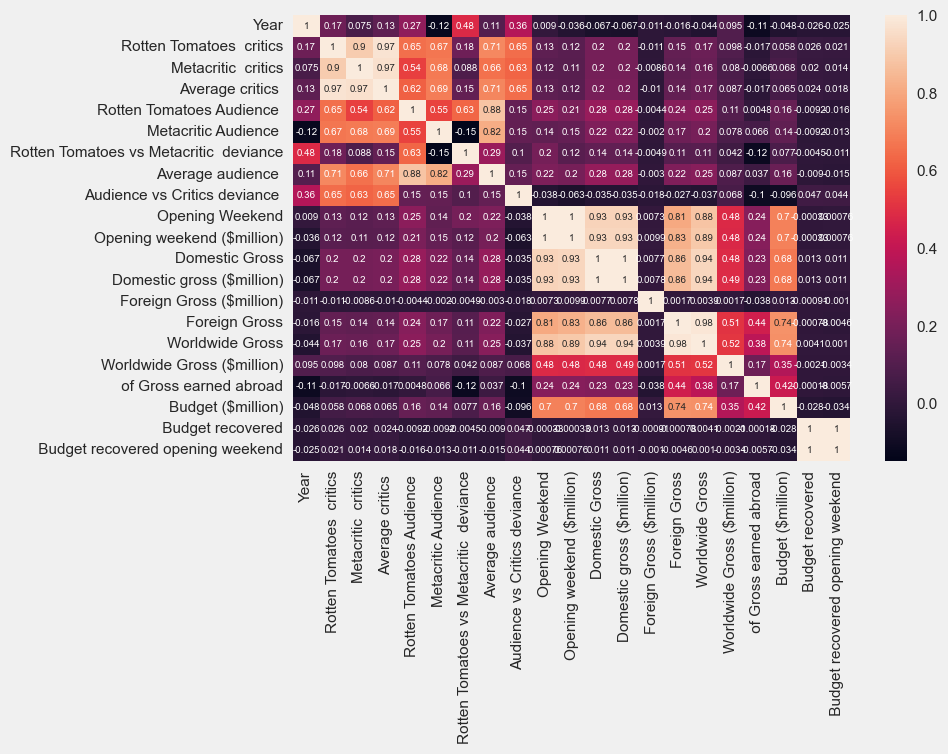

In [14]:
sns.heatmap(df.corr(),annot=True,annot_kws={"size":7})

In [15]:
df.isnull().sum()

Film                                          0
Year                                          0
Script Type                                 193
Rotten Tomatoes  critics                      1
Metacritic  critics                           0
Average critics                               0
Rotten Tomatoes Audience                      1
Metacritic Audience                           0
Rotten Tomatoes vs Metacritic  deviance       0
Average audience                              1
Audience vs Critics deviance                  0
Primary Genre                              1689
Genre                                       406
Opening Weekend                             405
Opening weekend ($million)                    0
Domestic Gross                                0
Domestic gross ($million)                     1
Foreign Gross ($million)                    101
Foreign Gross                               101
Worldwide Gross                               3
Worldwide Gross ($million)              

In [16]:
from sklearn.impute import KNNImputer
missing_cols=['Opening Weekend','Foreign Gross',' of Gross earned abroad',' Budget recovered',' Budget recovered opening weekend']
knn_imp=KNNImputer(n_neighbors=2)
df[missing_cols]=knn_imp.fit_transform(df[missing_cols])

In [17]:
df.drop(columns=['Audience vs Critics deviance ','Primary Genre','Oscar Winners','Oscar Detail','Rotten Tomatoes vs Metacritic  deviance','Film','Release Date (US)','Opening weekend ($million)',
'Domestic gross ($million)','Foreign Gross ($million)','Worldwide Gross ($million)','Link'],inplace=True)

In [18]:
df.shape

(1967, 17)

In [19]:
df.head()

,Year,Script Type,Rotten Tomatoes critics,Metacritic critics,Average critics,Rotten Tomatoes Audience,Metacritic Audience,Average audience,Genre,Opening Weekend,Domestic Gross,Foreign Gross,Worldwide Gross,of Gross earned abroad,Budget ($million),Budget recovered,Budget recovered opening weekend
0,2007,adaptation,60.0,51.0,56.0,89.0,71.0,80.0,"period, action",70885301.0,210614939.0,245453242.0,456068181.0,53.82,65.0,701.64,109.05
1,2007,remake,88.0,76.0,82.0,86.0,73.0,80.0,western,14035033.0,53606916.0,16173815.0,69780731.0,23.18,50.0,139.56,28.07
2,2007,adaptation,50.0,53.0,52.0,56.0,65.0,61.0,horror,15951902.0,39568996.0,35526091.0,75095087.0,47.31,32.0,234.67,49.85
3,2007,original screenplay,54.0,56.0,55.0,82.0,73.0,78.0,musical,3824988.0,24343673.0,5023470.0,29367143.0,17.11,45.0,65.26,8.50
4,2007,sequel,14.0,29.0,22.0,31.0,45.0,38.0,"sci-fi, horror",10059425.0,41797066.0,87086650.0,128883716.0,67.57,40.0,322.21,25.15


<Axes: >

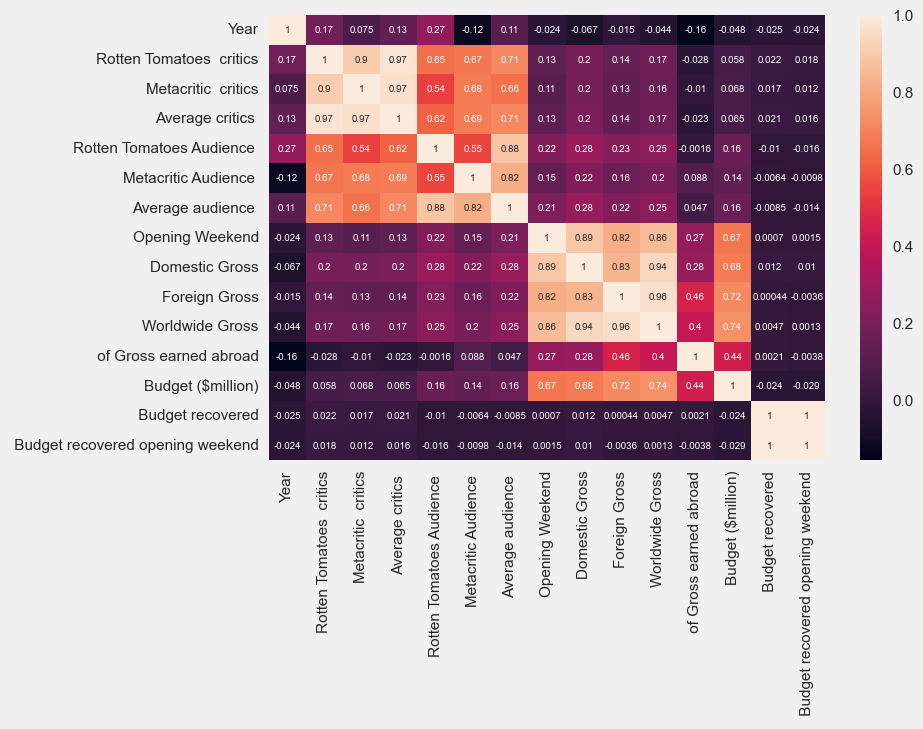

In [20]:
sns.heatmap(df.corr(),annot=True,annot_kws={'size':7})

In [21]:
df['Script Type'].unique()

array(['adaptation', 'remake', 'original screenplay', 'sequel',
       'based on a true story', 'documentary', 'sequel, adaptation',
       'remake / reboot', 'remake / reboot, adaptation', 'sequel ',
       'based on a true story ', 'adaptation, remake / reboot',
       'original screenplay ', 'based on a true story, adaptation',
       'prequel', 'adaptation, based on a true story',
       'adaptation, sequel', 'semi-sequel',
       'based on a true story, remake', nan], dtype=object)

In [22]:
df['Genre'].unique()

array(['period, action', 'western', 'horror', 'musical', 'sci-fi, horror',
       'family, comedy', 'crime, drama', 'animation', 'sports, comedy',
       'war, drama', 'drama, thriller', 'action, fantasy',
       'family, adventure', 'comedy', 'fantasy, comedy',
       'action, adventure', 'action, horror', 'romantic comedy', 'action',
       'drama', 'adventure', 'comedy, drama', 'thriller',
       'fantasy, drama', 'sci-fi, thriller', 'crime, comedy', 'romance',
       'period, adventure', 'action, comedy', 'documentary',
       'music, drama', 'action, thriller', 'fantasy', 'sci-fi, action',
       'horror, thriller', 'animation, adventure, family',
       'biography, history', 'drama, romance, thriller',
       'action, adventure, crime', 'animation, action, adventure',
       'action, adventure, fantasy', 'action, adventure, sci-fi',
       'action, crime, thriller', 'action, adventure,  ',
       'fantasy, romance', 'animation, adventure, comedy',
       'adventure, comedy', 'act

In [23]:
df['Script Type'].mode()

0    original screenplay
Name: Script Type, dtype: object

In [24]:
df['Genre'].mode()

0    drama
Name: Genre, dtype: object

original screenplay                  707
adaptation                           522
sequel                               275
based on a true story                131
remake / reboot                       44
original screenplay                   33
remake                                26
sequel, adaptation                     9
adaptation, based on a true story      8
based on a true story                  5
prequel                                3
adaptation, sequel                     3
adaptation, remake / reboot            2
semi-sequel                            1
sequel                                 1
based on a true story, adaptation      1
remake / reboot, adaptation            1
documentary                            1
based on a true story, remake          1
Name: Script Type, dtype: int64


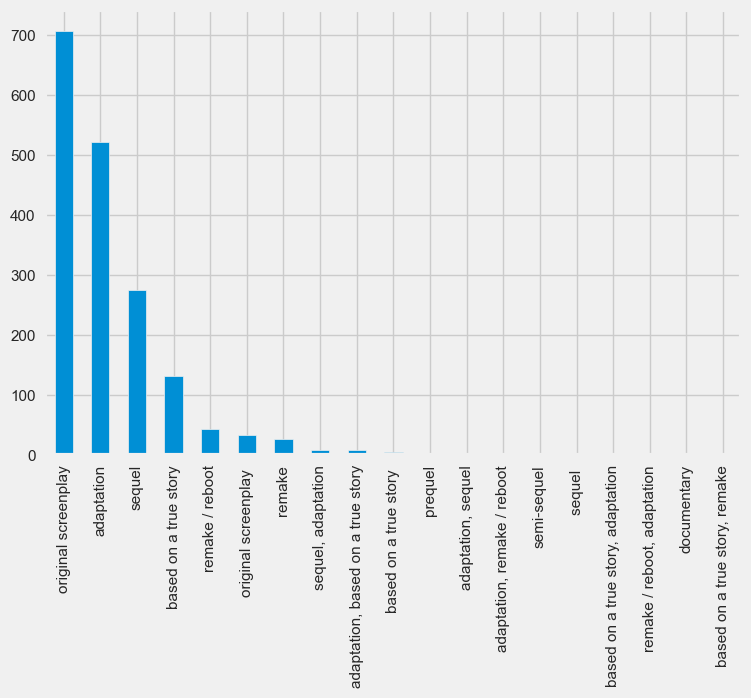

In [25]:
df['Script Type'].value_counts().plot(kind='bar')
print(df['Script Type'].value_counts())

drama                                                                                         123
comedy                                                                                        119
comedy, romance                                                                                76
horror                                                                                         46
action                                                                                         45
thriller                                                                                       44
Comedy                                                                                         40
Drama                                                                                          39
animation                                                                                      37
action, adventure                                                                              30
Adventure           

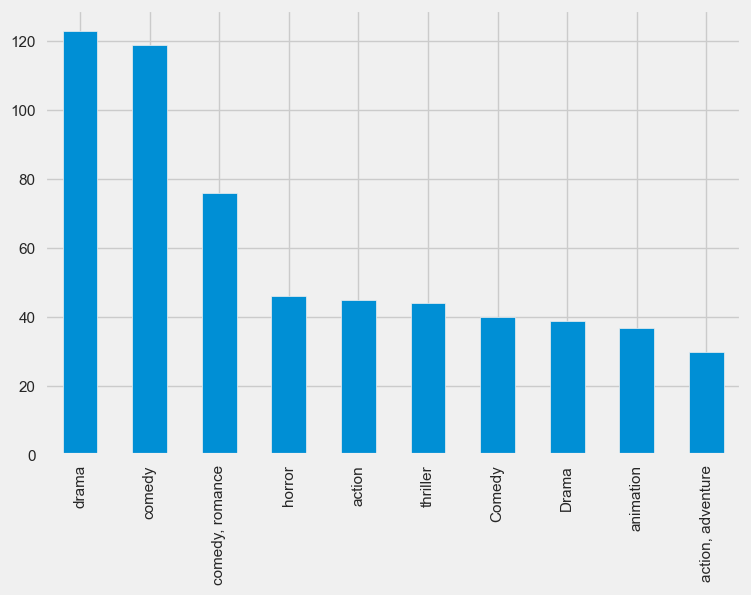

In [26]:
top_10_most_common_genres=df['Genre'].value_counts().head(10)
top_10_most_common_genres.plot(kind='bar')
print(df['Genre'].value_counts())

In [27]:
df['Script Type']=df['Script Type'].fillna(df['Script Type'].mode().iloc[0])
df['Genre']=df['Genre'].fillna(df['Genre'].mode().iloc[0])

In [28]:
df.dropna(inplace=True)

In [29]:
df.shape

(1962, 17)

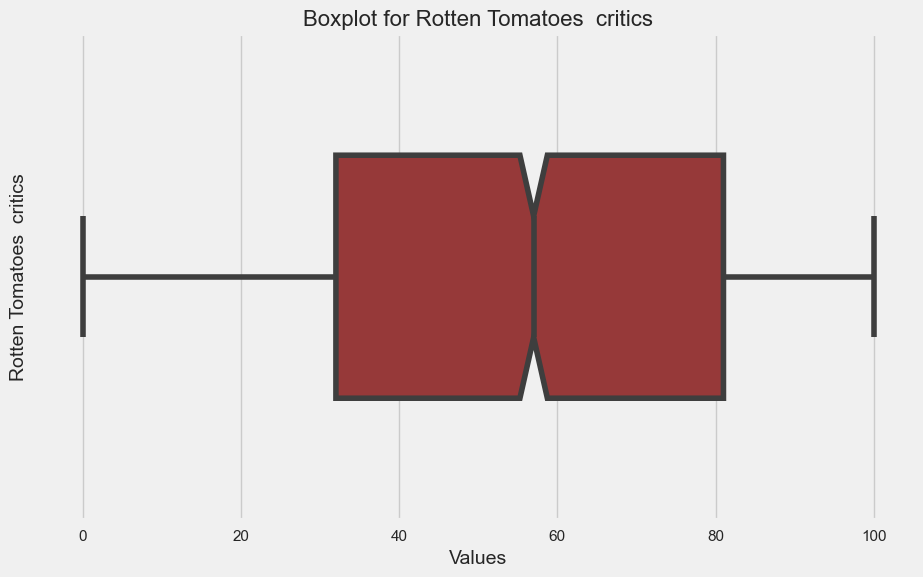

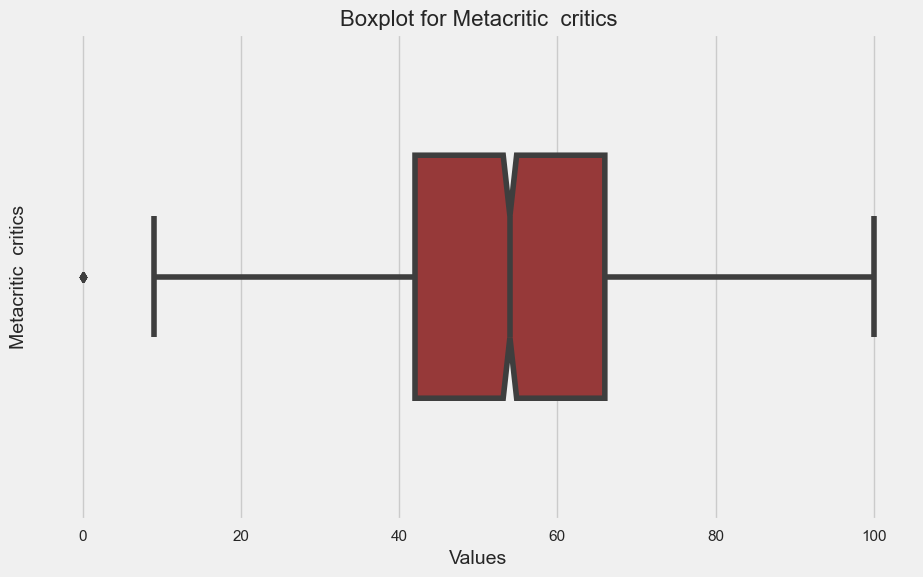

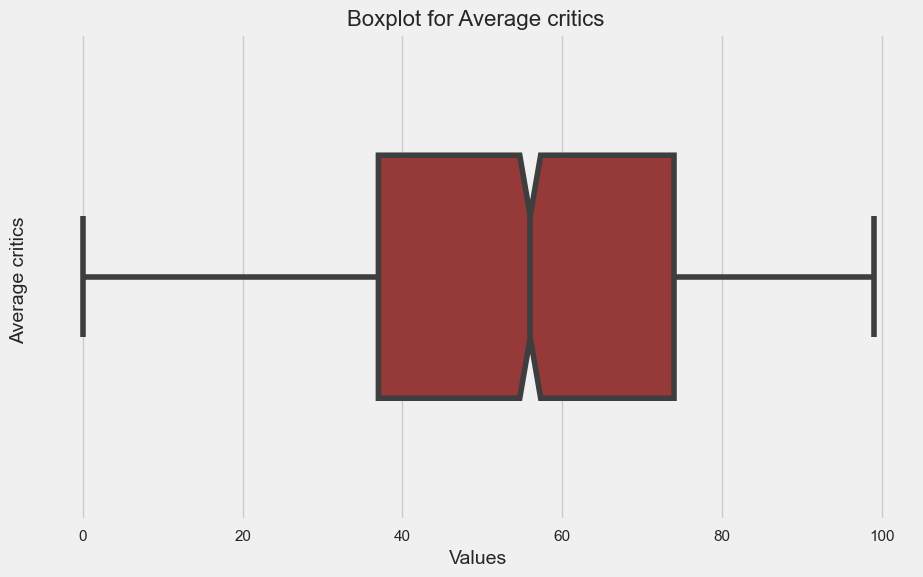

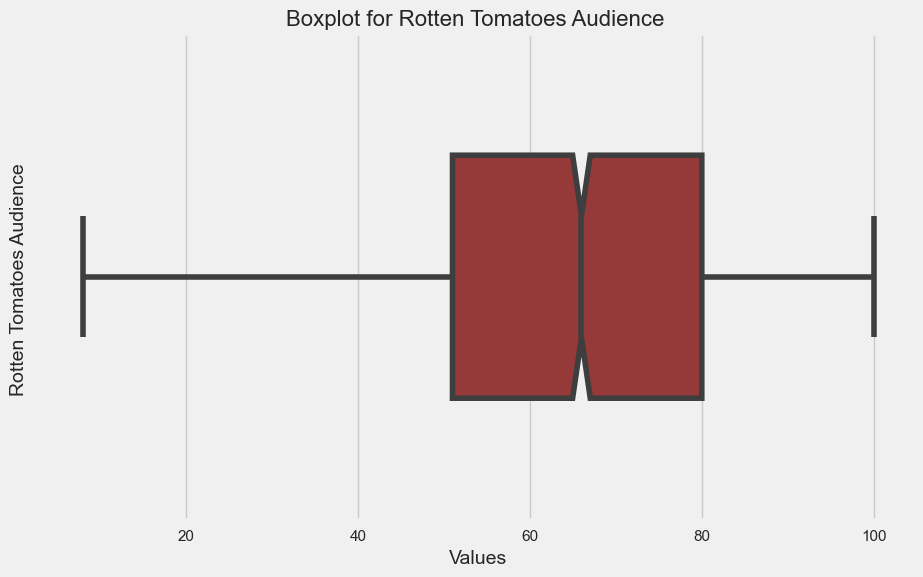

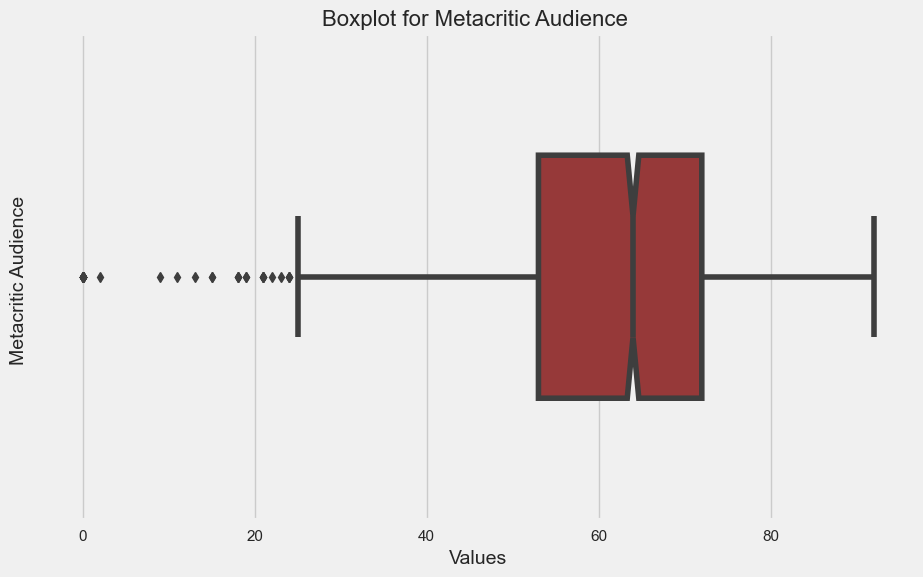

...

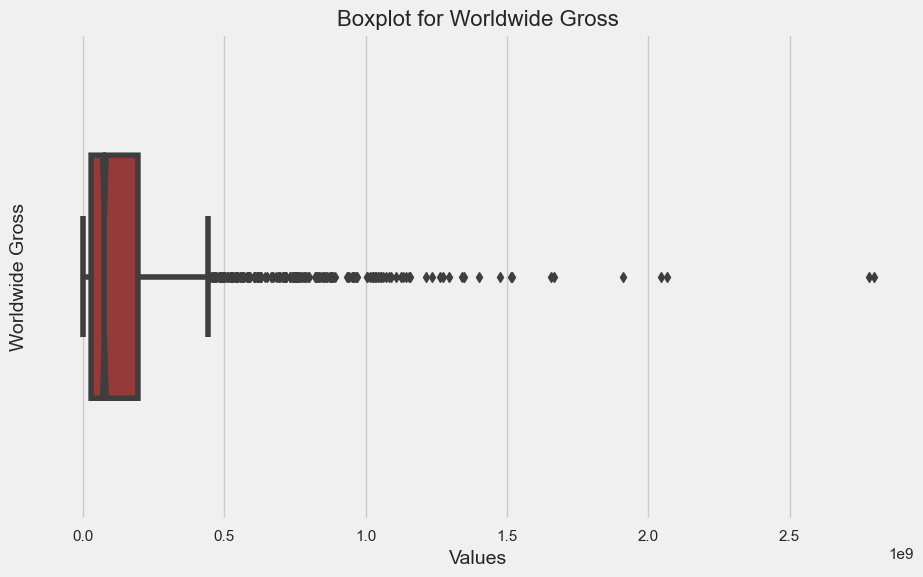

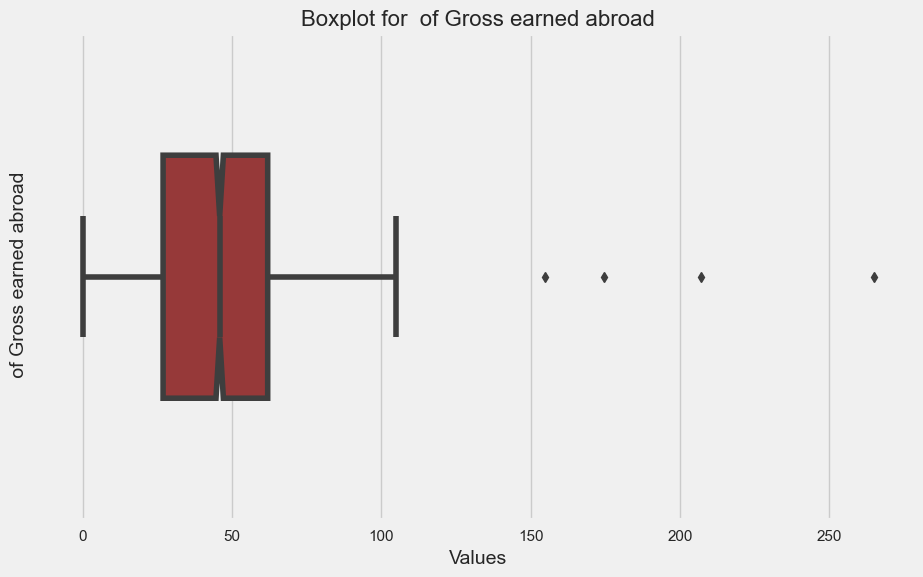

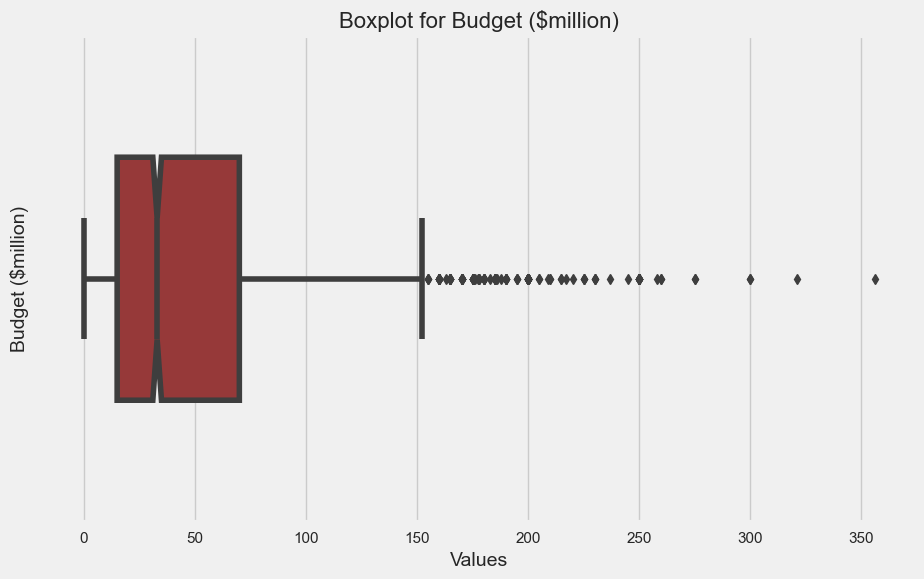

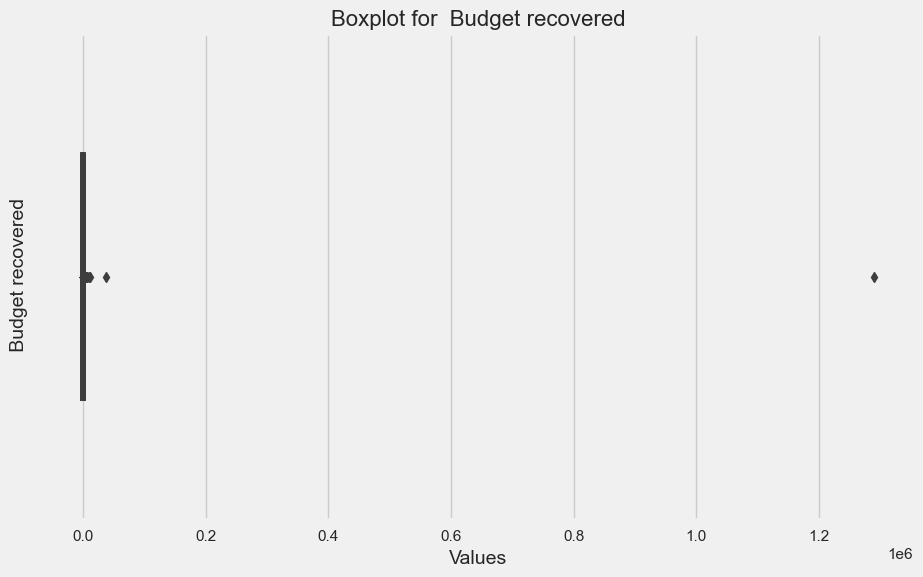

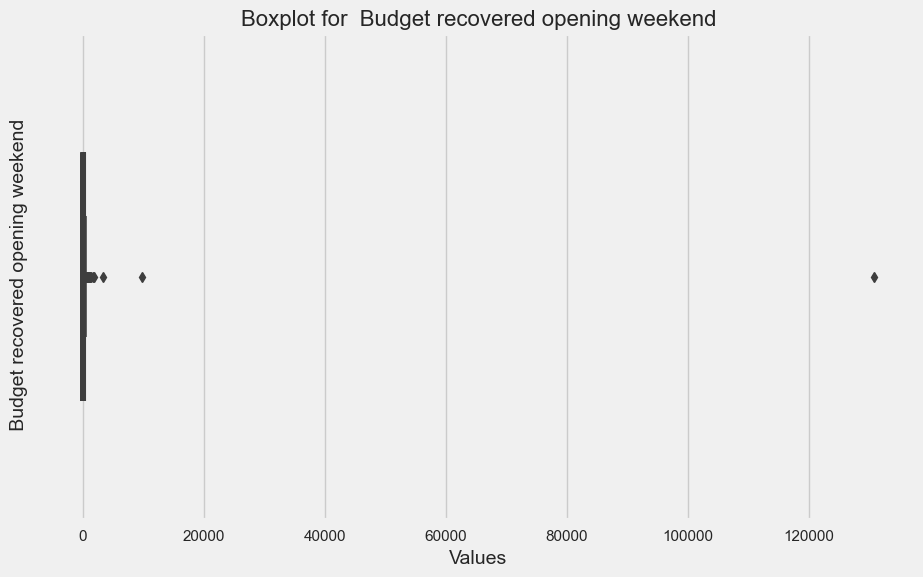

In [30]:
for cols in df.select_dtypes(float):
  plt.figure(figsize=(10, 6))
  sns.boxplot(x=df[cols], color='brown', width=0.5, notch=True)
  plt.title(f'Boxplot for {cols}', fontsize=16)
  plt.xlabel('Values', fontsize=14)
  plt.ylabel(cols, fontsize=14)
  plt.show()

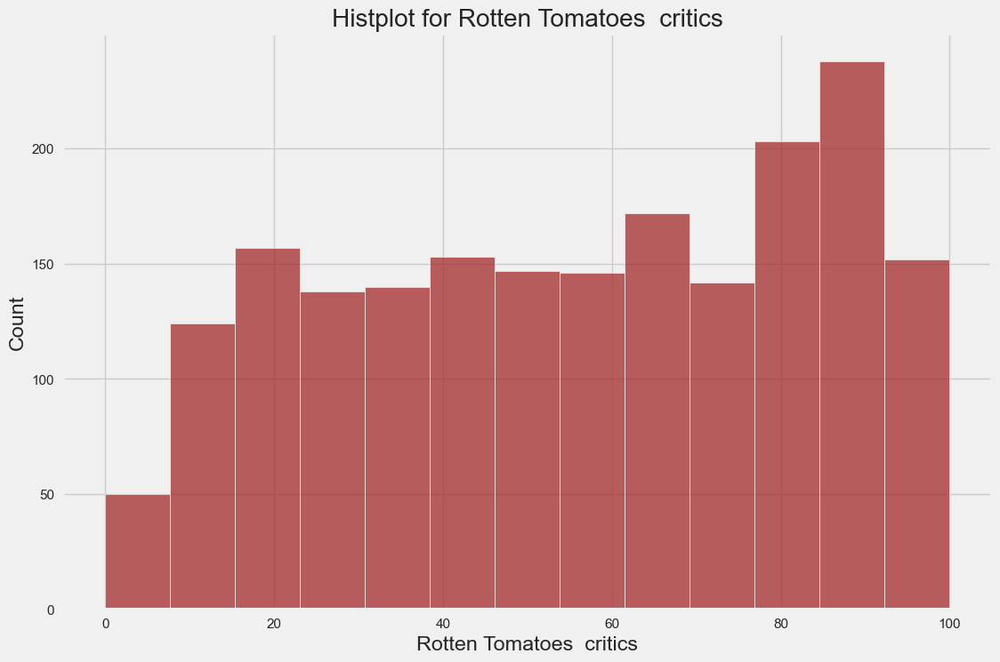

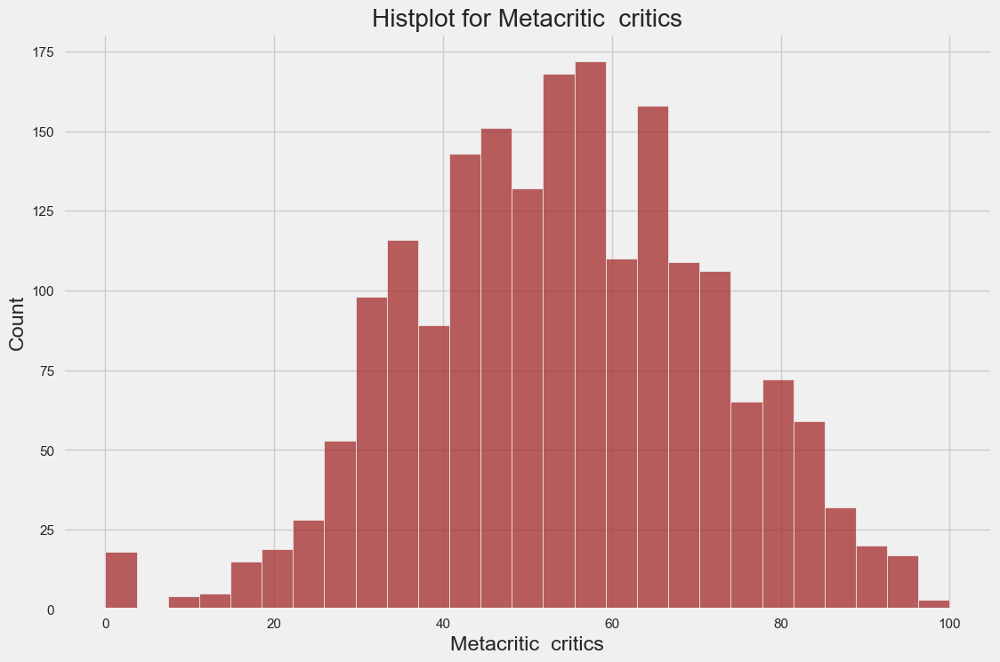

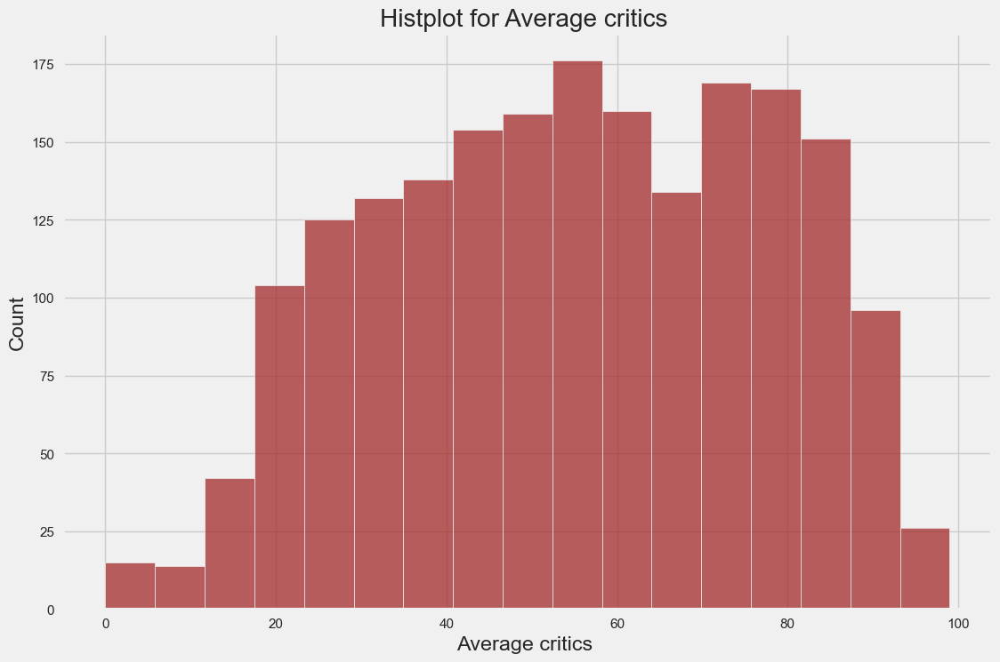

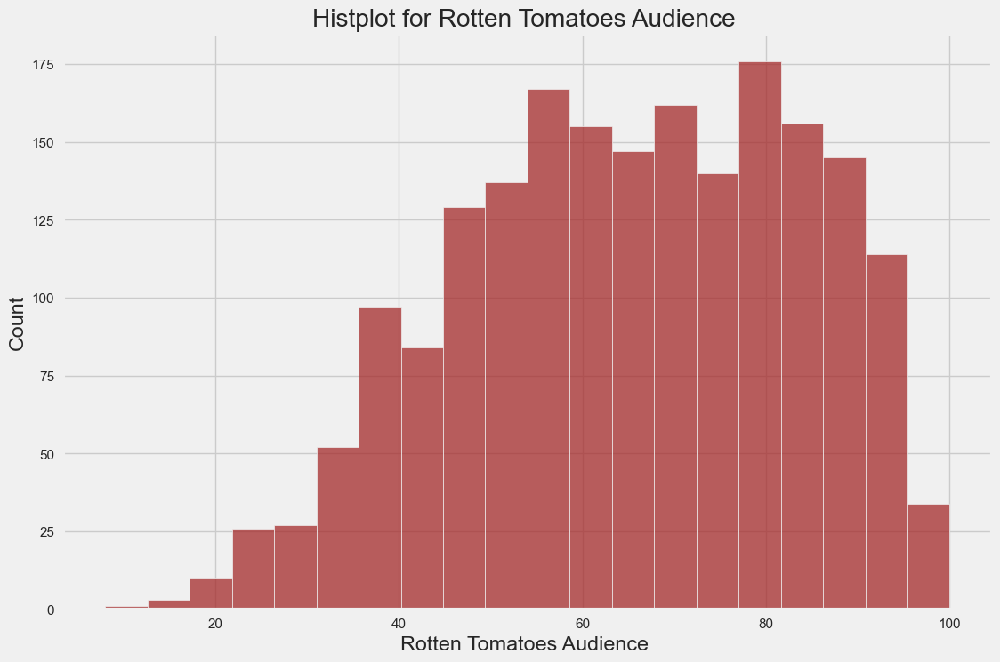

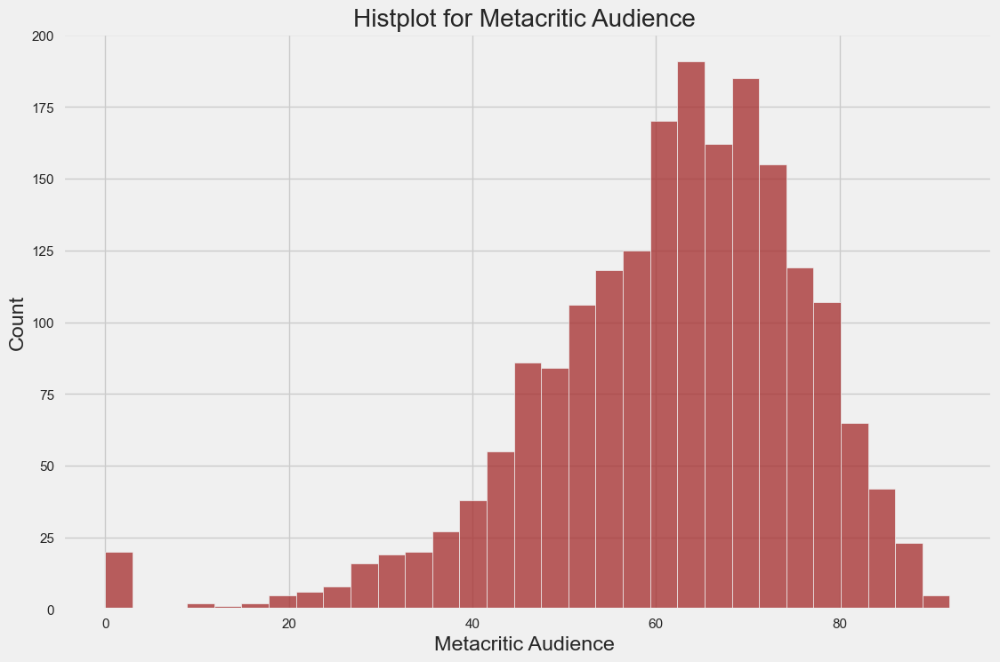

...

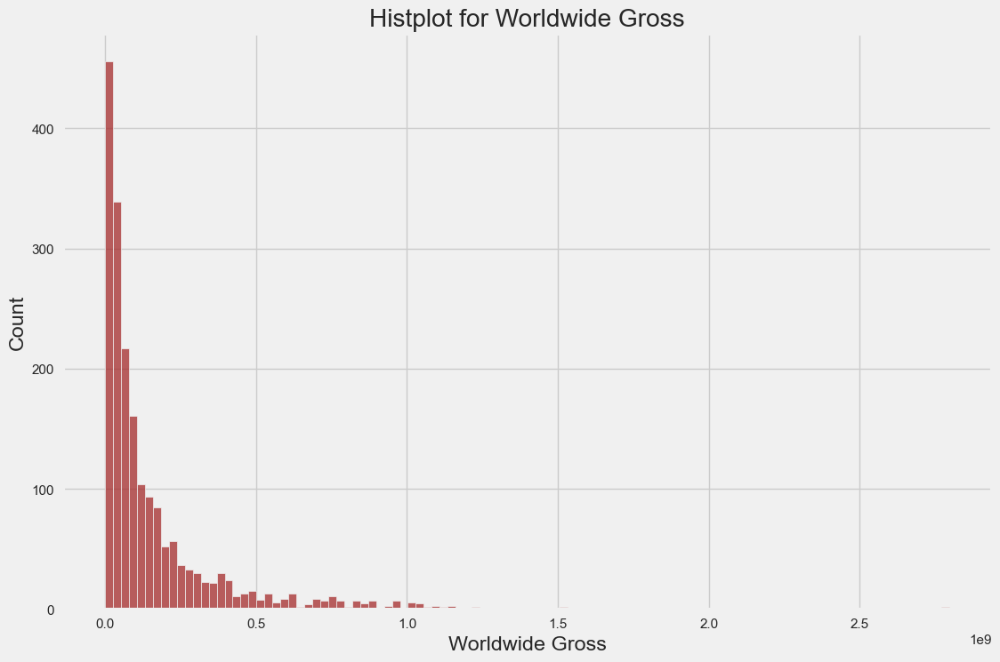

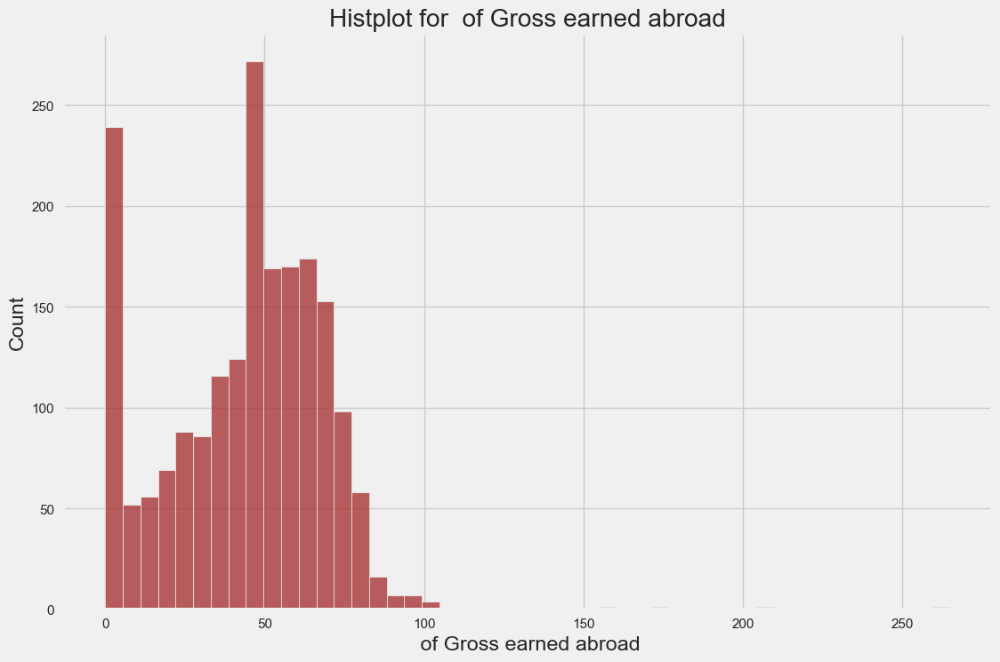

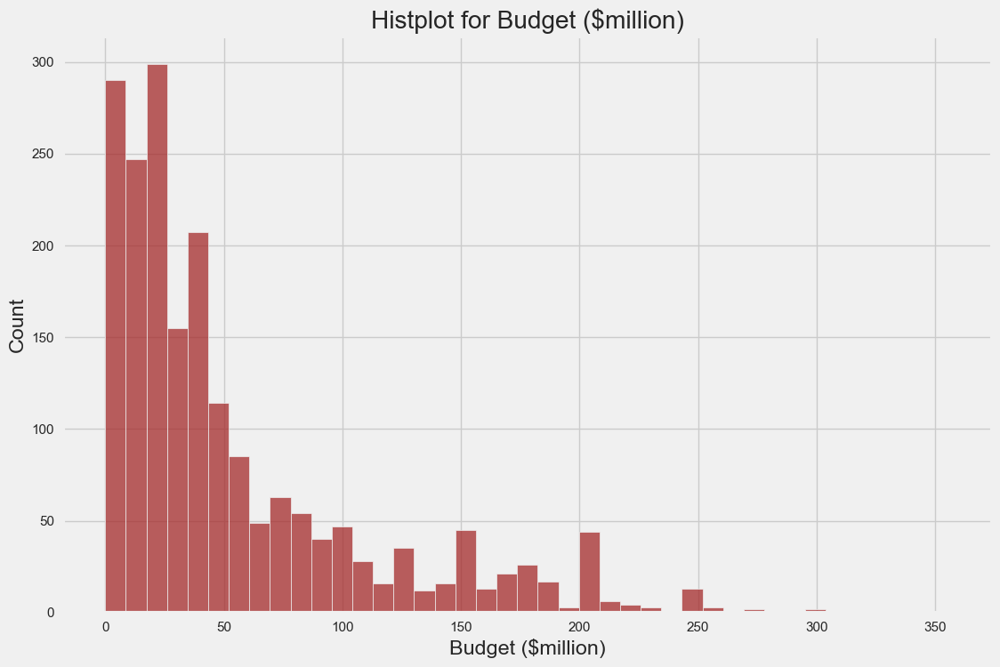

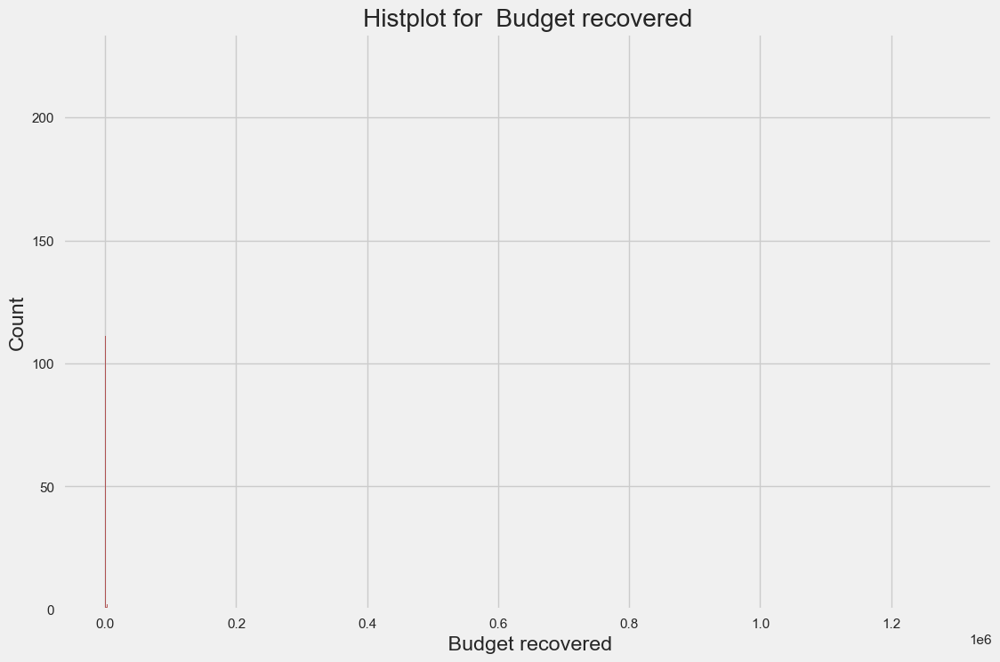

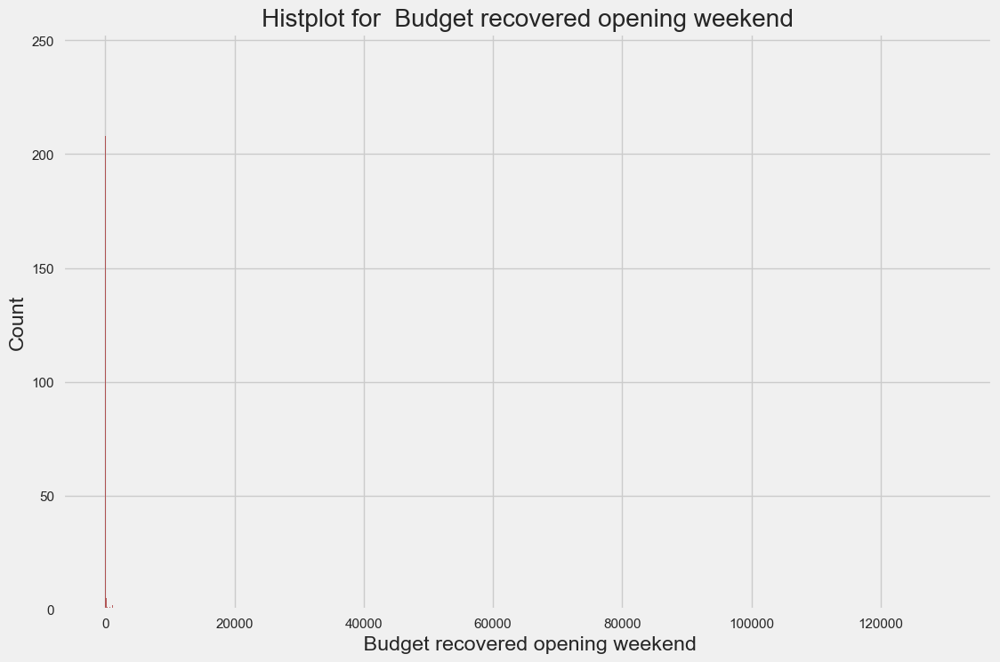

In [31]:
for cols in df.select_dtypes(float):
    plt.figure(figsize=(12,8))
    sns.histplot(x=df[cols],color='brown')
    plt.title(f"Histplot for {cols}")
    plt.show()

In [32]:
for cols in df.select_dtypes(float):
    per25=df[cols].quantile(0.25)
    per75=df[cols].quantile(0.75)
    iqr=per75-per25
    upper_limit = per75 + 1.5 * iqr
    lower_limit = per25 - 1.5 * iqr
    print(f"Upper limit {cols}",upper_limit)
    print(f"Lower limit {cols}",lower_limit)

Upper limit Rotten Tomatoes  critics 154.5
Lower limit Rotten Tomatoes  critics -41.5
Upper limit Metacritic  critics 102.0
Lower limit Metacritic  critics 6.0
Upper limit Average critics  129.5
Lower limit Average critics  -18.5
Upper limit Rotten Tomatoes Audience  123.5
Lower limit Rotten Tomatoes Audience  7.5
Upper limit Metacritic Audience  100.5
Lower limit Metacritic Audience  24.5
Upper limit Average audience  106.5
Lower limit Average audience  22.5
Upper limit Opening Weekend 53202110.25
Lower limit Opening Weekend -21256733.75
Upper limit Domestic Gross 185539346.25
Lower limit Domestic Gross -85529857.75
Upper limit Foreign Gross 243743391.0
Lower limit Foreign Gross -132498985.0
Upper limit Worldwide Gross 443136899.75
Lower limit Worldwide Gross -218889568.25
Upper limit  of Gross earned abroad 114.44375000000001
Lower limit  of Gross earned abroad -25.666250000000005
Upper limit Budget ($million) 152.5
Lower limit Budget ($million) -67.5
Upper limit  Budget recovered 92

In [33]:
df.columns

Index(['Year', 'Script Type', 'Rotten Tomatoes  critics',
       'Metacritic  critics', 'Average critics ', 'Rotten Tomatoes Audience ',
       'Metacritic Audience ', 'Average audience ', 'Genre', 'Opening Weekend',
       'Domestic Gross', 'Foreign Gross', 'Worldwide Gross',
       ' of Gross earned abroad', 'Budget ($million)', ' Budget recovered',
       ' Budget recovered opening weekend'],
      dtype='object')

In [34]:
for cols in df.select_dtypes(float):
    mean_value = df[cols].mean()
    std_dev = df[cols].std()
    median_value = df[cols].median()
    Q1 = df[cols].quantile(0.25)
    Q3 = df[cols].quantile(0.75)
    IQR = Q3 - Q1

    # Tukey's Method
    outliers_tukey = (df[cols] < (Q1 - 3 * IQR)) | (df[cols] > (Q3 + 3 * IQR))
    print("Tukey's Method Outliers:")
    print(df[cols][outliers_tukey])


Tukey's Method Outliers:
Series([], Name: Rotten Tomatoes  critics, dtype: float64)
Tukey's Method Outliers:
Series([], Name: Metacritic  critics, dtype: float64)
Tukey's Method Outliers:
Series([], Name: Average critics , dtype: float64)
Tukey's Method Outliers:
Series([], Name: Rotten Tomatoes Audience , dtype: float64)
Tukey's Method Outliers:
Series([], Name: Metacritic Audience , dtype: float64)
Tukey's Method Outliers:
Series([], Name: Average audience , dtype: float64)
Tukey's Method Outliers:
49      114732820.0
56      121629270.0
59      151116516.0
96       98620000.0
97      158400000.0
98      100100000.0
242     109000000.0
248      85100000.0
292     142800000.0
373     110300000.0
377     116100000.0
380     128100000.0
391     125000000.0
516      90150000.0
519      97850000.0
532      86190000.0
533     169190000.0
538     138120000.0
546      85950000.0
654     160887295.0
657     207438708.0
659      84617303.0
660      88364714.0
670     141067634.0
678     152535

In [35]:
for cols in df.select_dtypes(float):
    mean_value = df[cols].mean()
    std_dev = df[cols].std()
    median_value = df[cols].median()
    Q1 = df[cols].quantile(0.25)
    Q3 = df[cols].quantile(0.75)
    IQR = Q3 - Q1

    # Tukey's Method
    outliers_tukey = (df[cols] < (Q1 - 1.5 * IQR)) | (df[cols] > (Q3 + 1.5 * IQR))
    new_df = df[~outliers_tukey]
    print("Tukey's Method Outliers:")
    print(new_df[cols][outliers_tukey])


Tukey's Method Outliers:
Series([], Name: Rotten Tomatoes  critics, dtype: float64)
Tukey's Method Outliers:
Series([], Name: Metacritic  critics, dtype: float64)
Tukey's Method Outliers:
Series([], Name: Average critics , dtype: float64)
Tukey's Method Outliers:
Series([], Name: Rotten Tomatoes Audience , dtype: float64)
Tukey's Method Outliers:
Series([], Name: Metacritic Audience , dtype: float64)
Tukey's Method Outliers:
Series([], Name: Average audience , dtype: float64)
Tukey's Method Outliers:
Series([], Name: Opening Weekend, dtype: float64)
Tukey's Method Outliers:
Series([], Name: Domestic Gross, dtype: float64)
Tukey's Method Outliers:
Series([], Name: Foreign Gross, dtype: float64)
Tukey's Method Outliers:
Series([], Name: Worldwide Gross, dtype: float64)
Tukey's Method Outliers:
Series([], Name:  of Gross earned abroad, dtype: float64)
Tukey's Method Outliers:
Series([], Name: Budget ($million), dtype: float64)
Tukey's Method Outliers:
Series([], Name:  Budget recovered, d

In [36]:
new_df_cap=new_df.copy()
for cols in new_df_cap.select_dtypes(float):
    per25=df[cols].quantile(0.25)
    per75=df[cols].quantile(0.75)
    iqr=per75-per25
    upper_limit = per75 + 1.5 * iqr
    lower_limit = per25 - 1.5 * iqr
    new_df_cap[cols]=np.where(
    new_df_cap[cols]>upper_limit,
    upper_limit,
    np.where(new_df_cap[cols]<lower_limit,
            lower_limit,
            new_df_cap[cols]
            )
    )

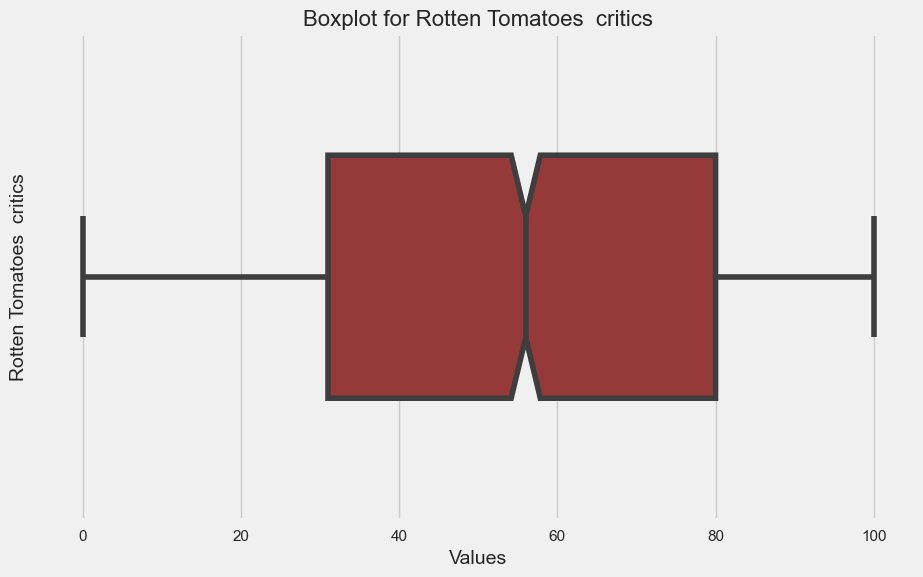

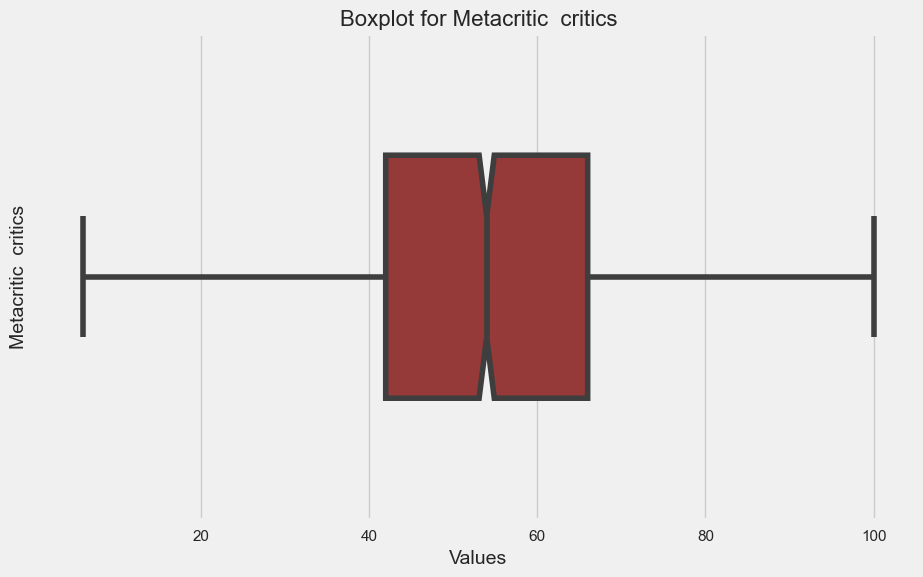

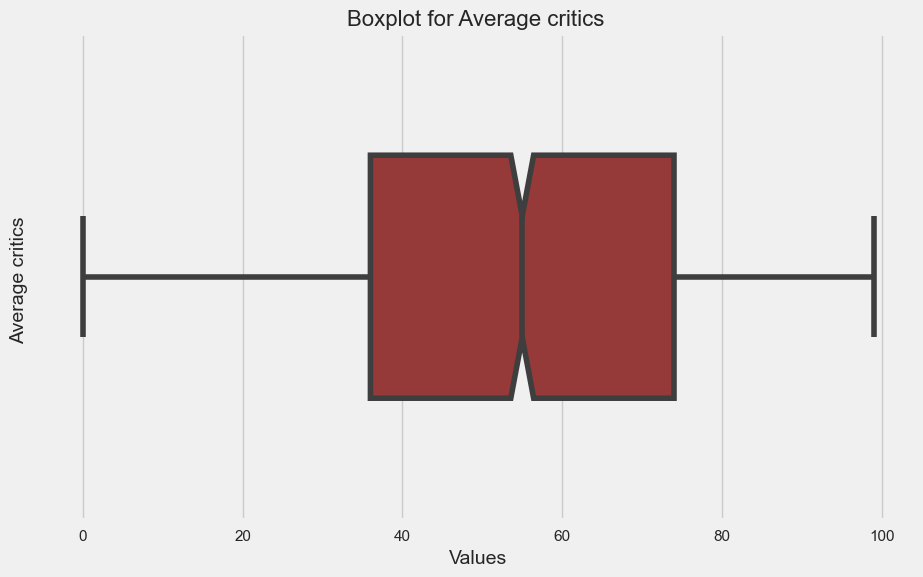

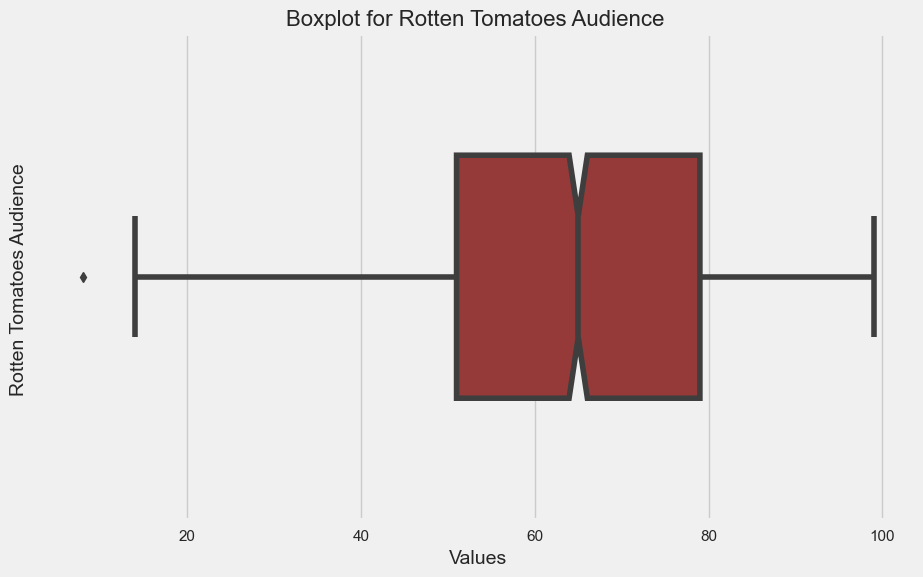

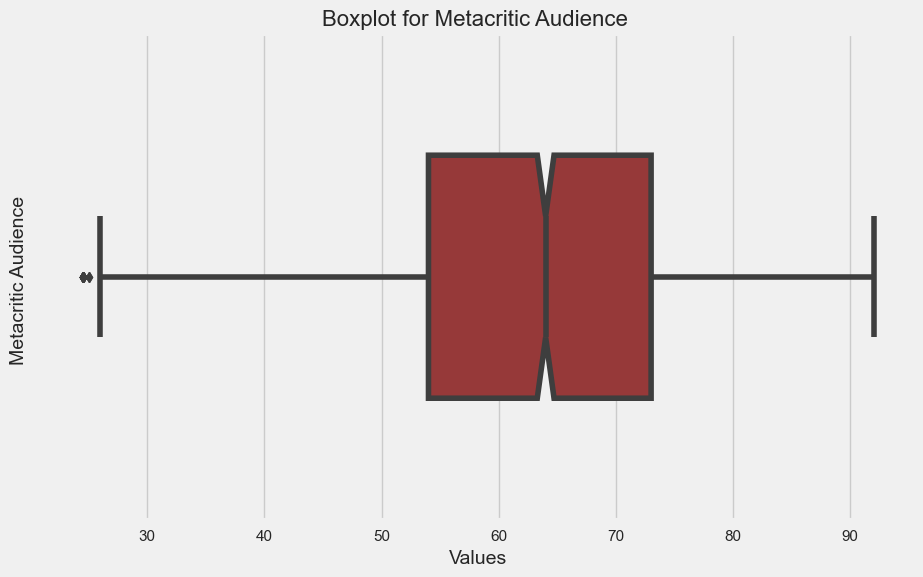

...

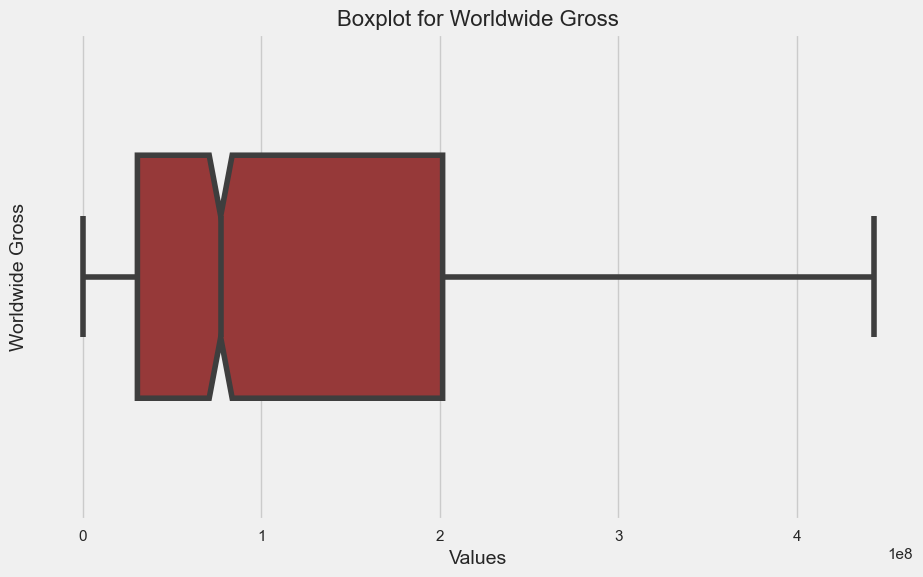

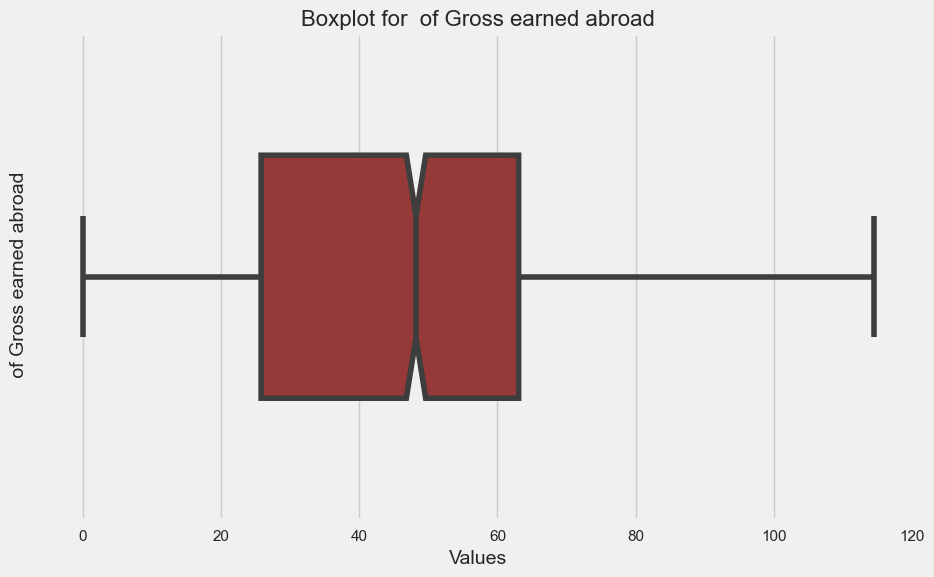

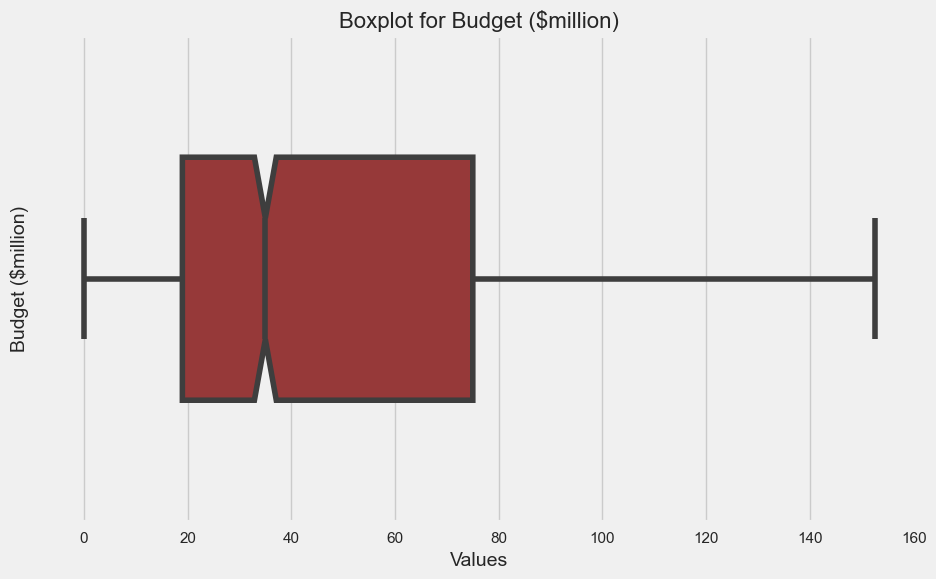

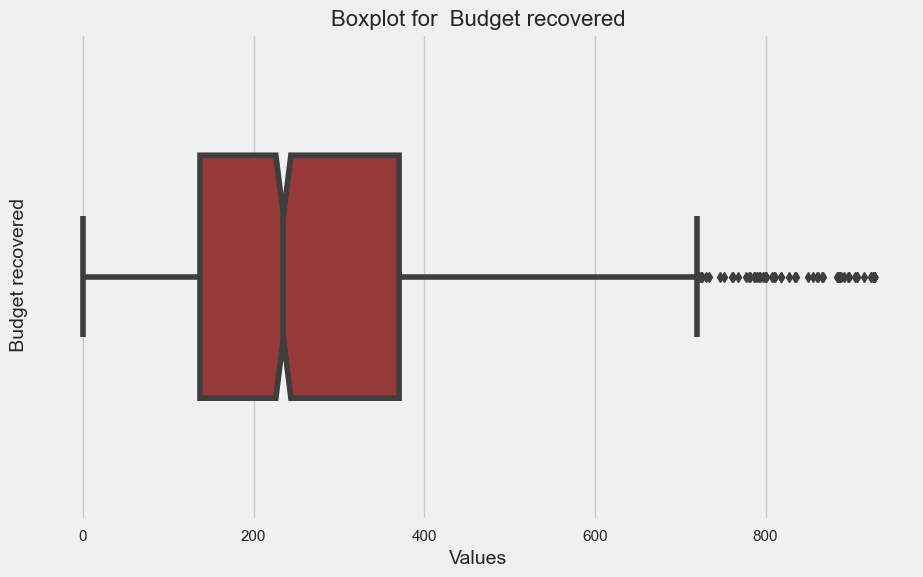

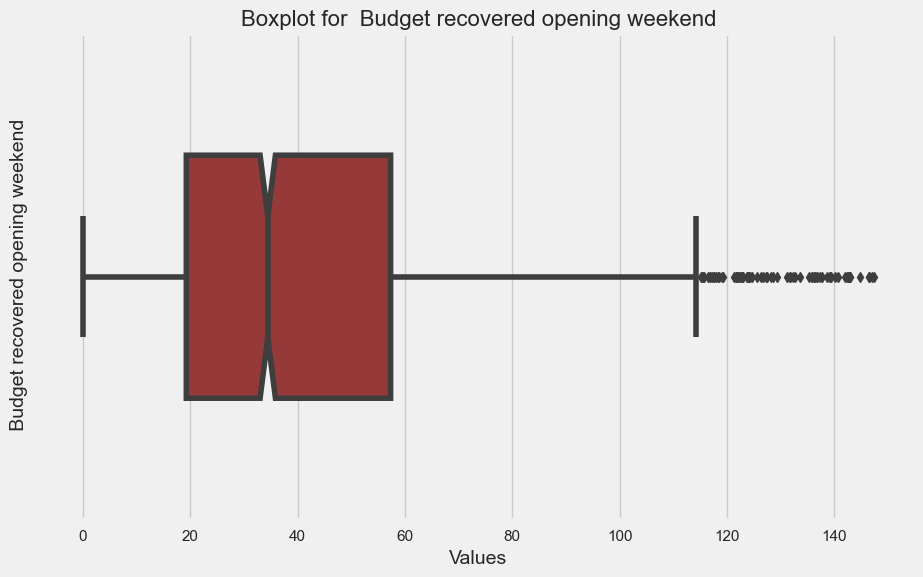

In [37]:
for cols in new_df_cap.select_dtypes(float):
  plt.figure(figsize=(10, 6))
  sns.boxplot(x=new_df_cap[cols], color='brown', width=0.5, notch=True)
  plt.title(f'Boxplot for {cols}', fontsize=16)
  plt.xlabel('Values', fontsize=14)
  plt.ylabel(cols, fontsize=14)
  plt.show()

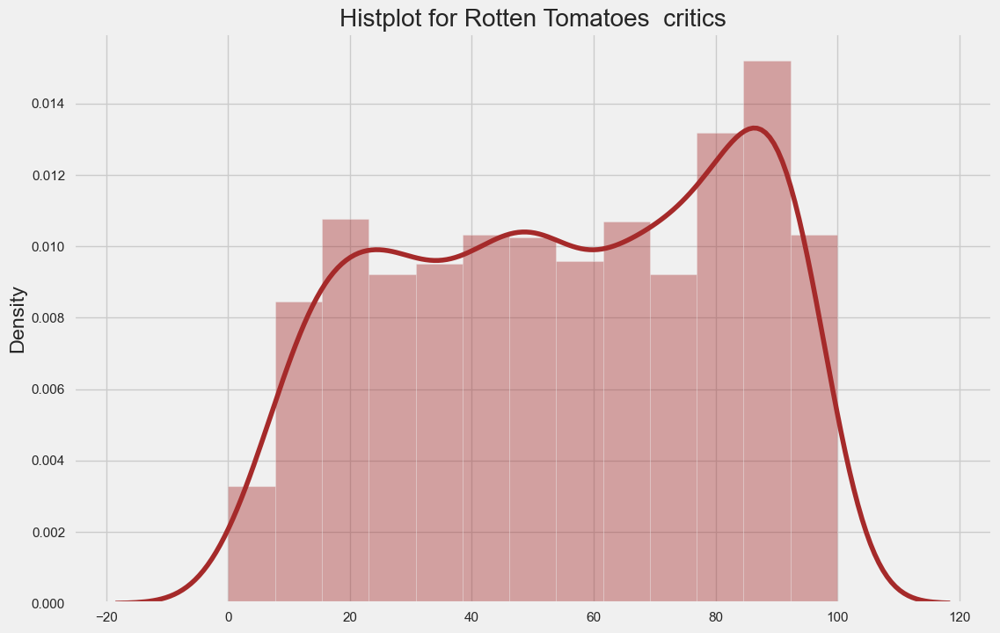

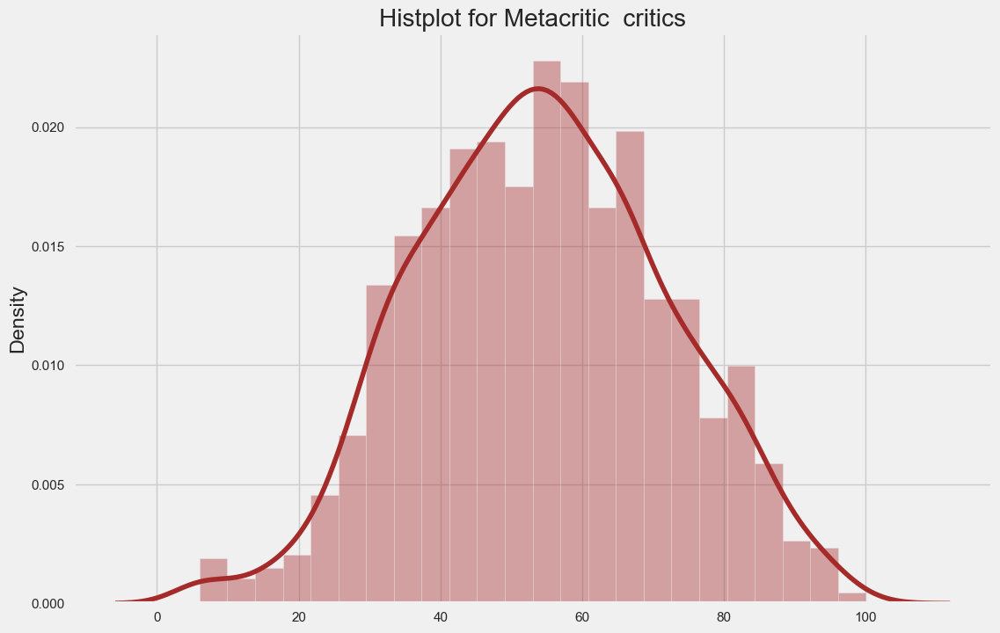

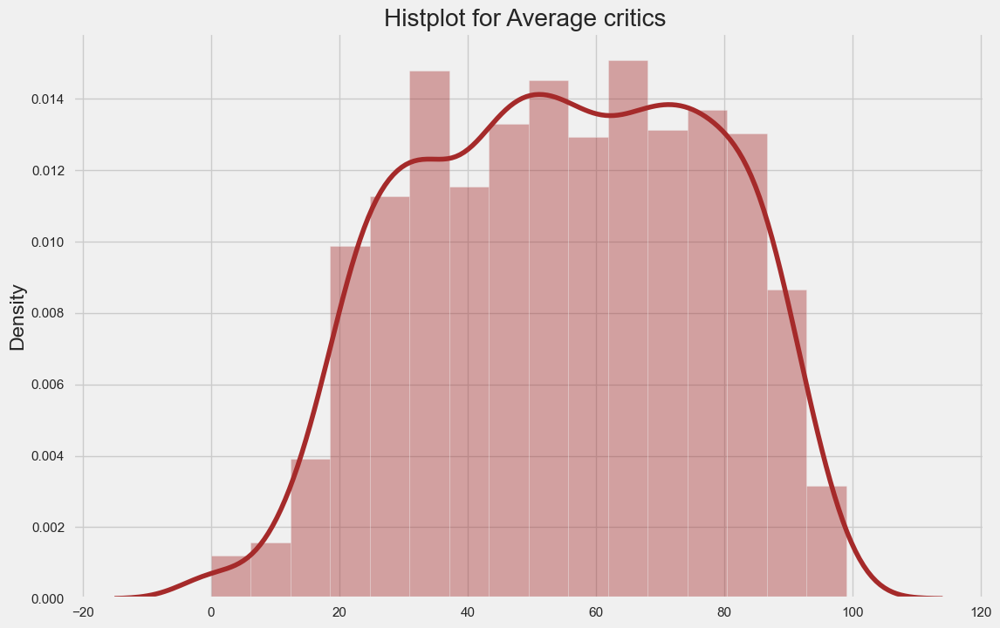

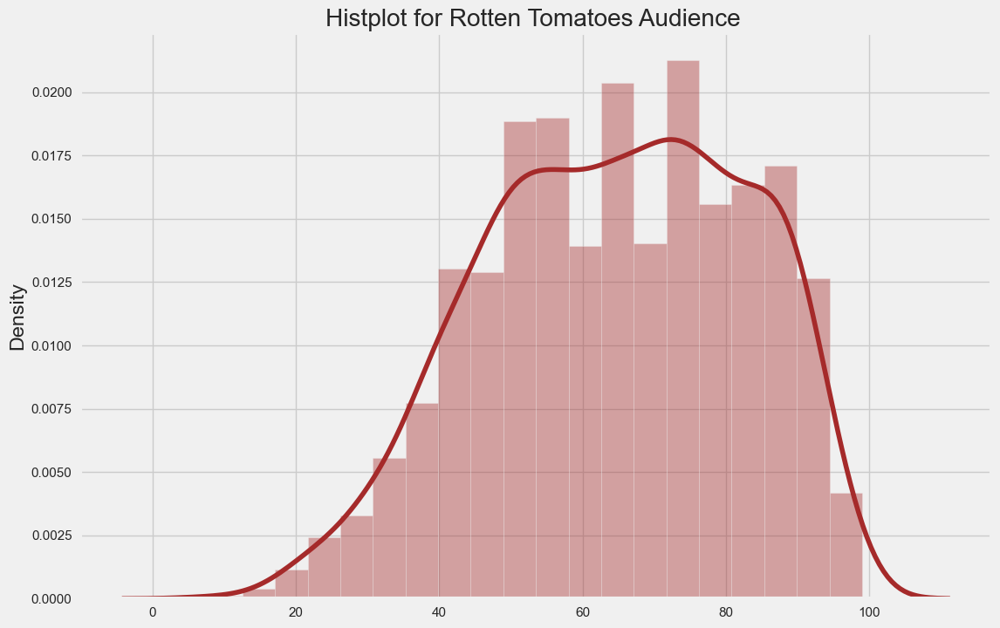

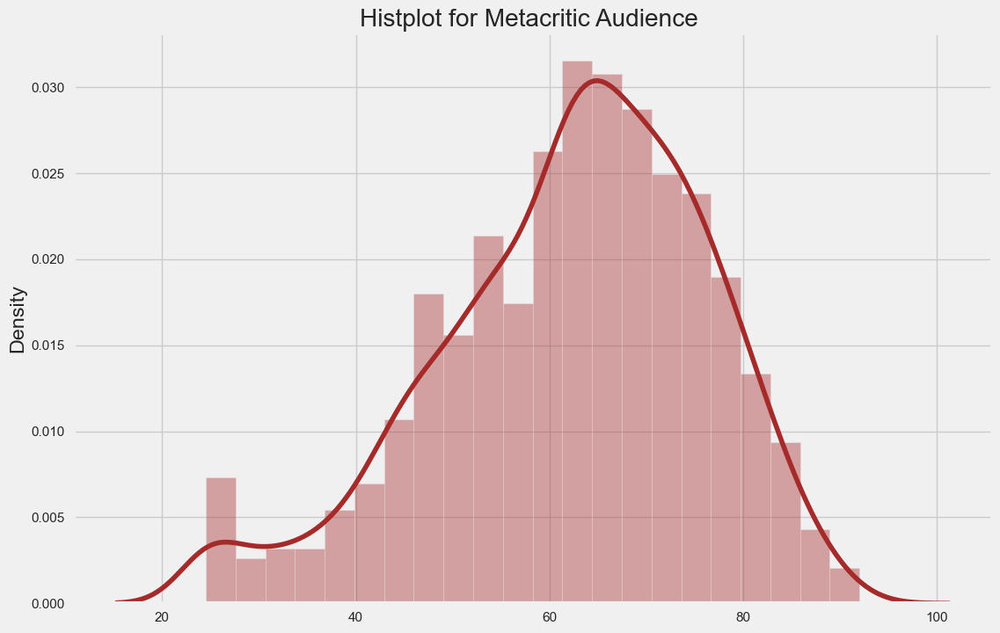

...

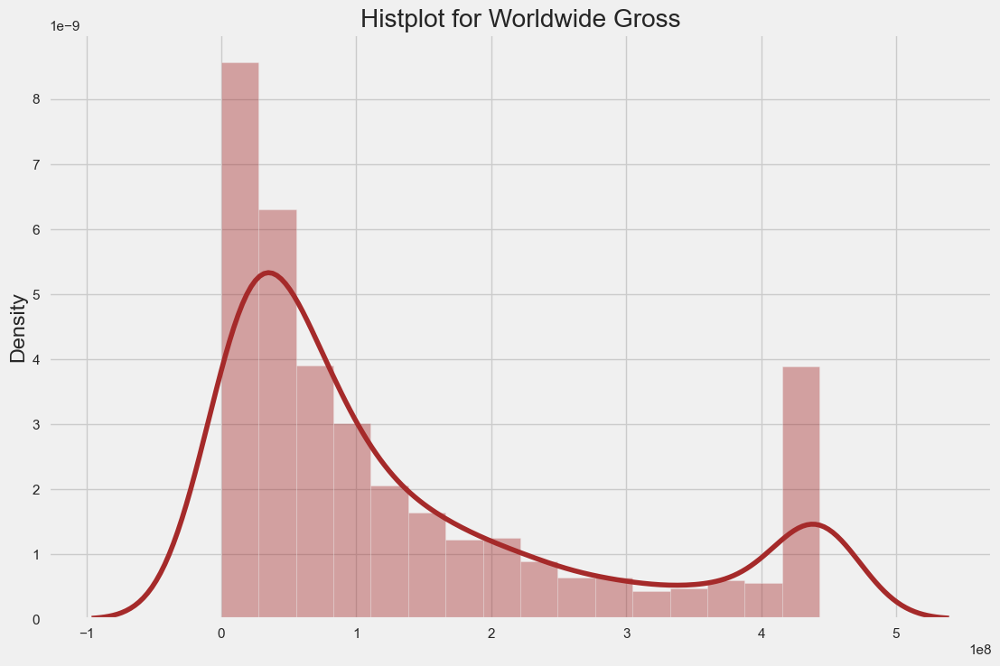

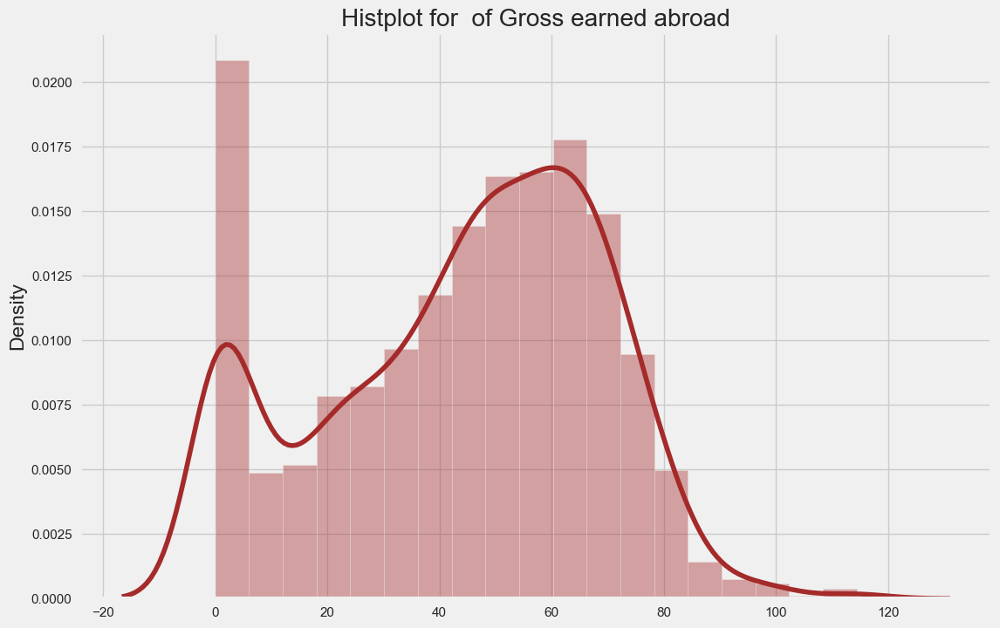

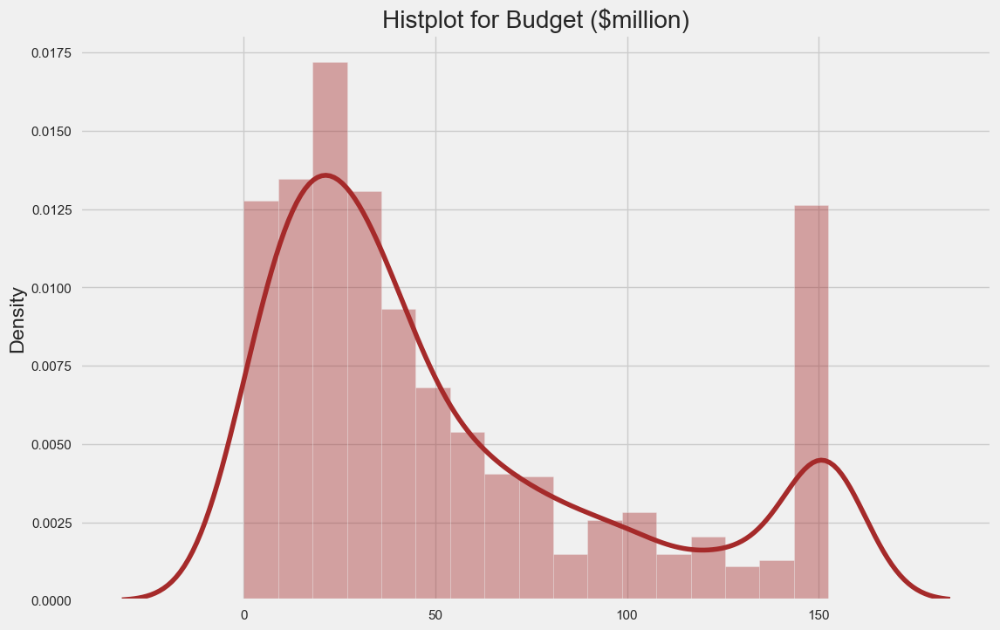

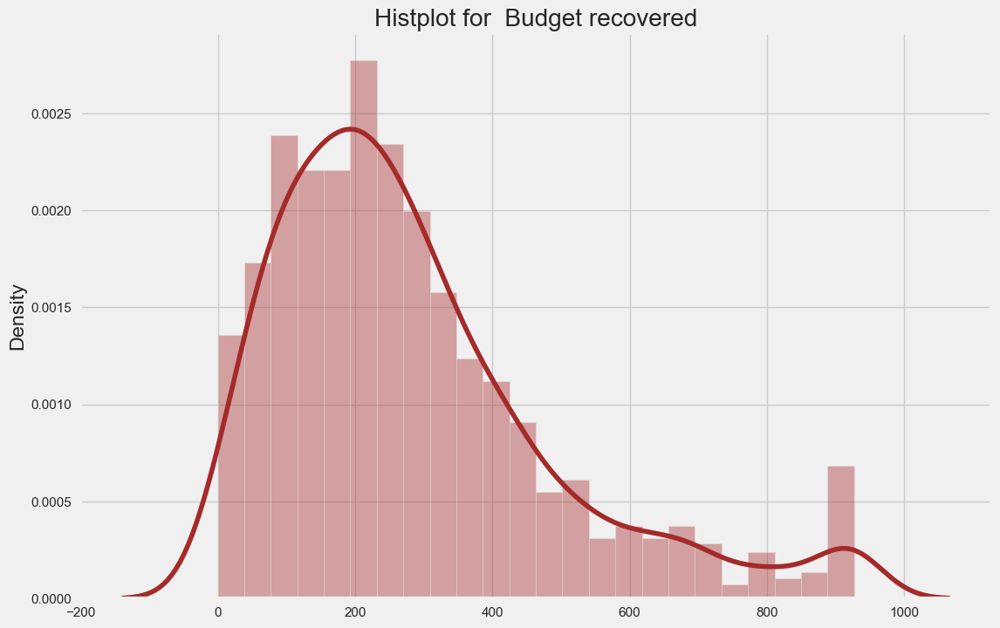

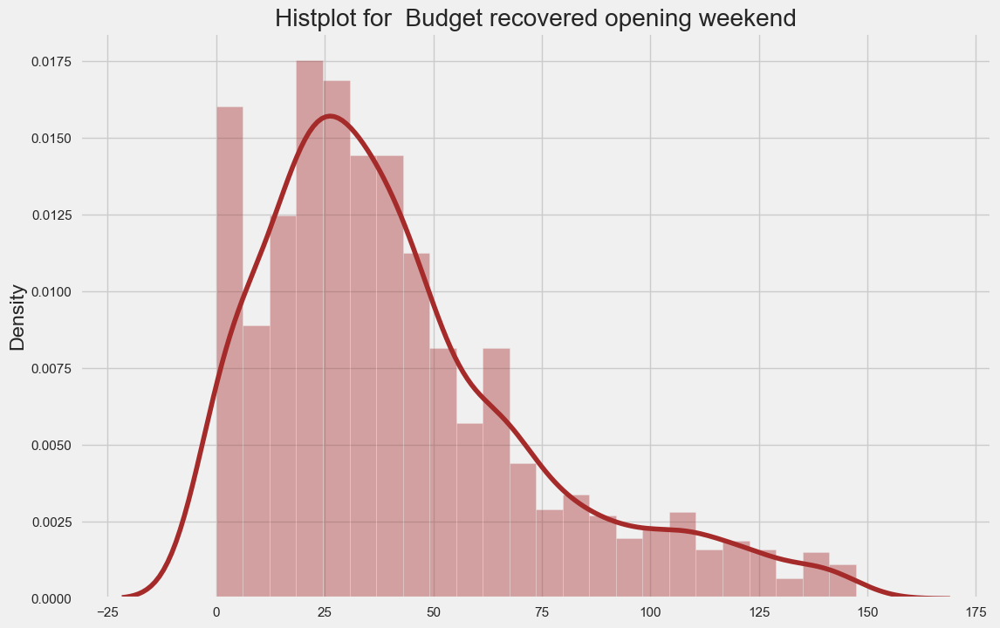

In [38]:
for cols in new_df_cap.select_dtypes(float):
    plt.figure(figsize=(12,8))
    sns.distplot(x=new_df_cap[cols],color='brown')
    plt.title(f"Histplot for {cols}")
    plt.show()

In [39]:
new_df=new_df_cap.copy()

In [40]:
new_df.columns

Index(['Year', 'Script Type', 'Rotten Tomatoes  critics',
       'Metacritic  critics', 'Average critics ', 'Rotten Tomatoes Audience ',
       'Metacritic Audience ', 'Average audience ', 'Genre', 'Opening Weekend',
       'Domestic Gross', 'Foreign Gross', 'Worldwide Gross',
       ' of Gross earned abroad', 'Budget ($million)', ' Budget recovered',
       ' Budget recovered opening weekend'],
      dtype='object')

for cols in new_df.select_dtypes(float):
    new_df[cols]=np.log(new_df[cols])

In [41]:
from sklearn.preprocessing import PowerTransformer
new_df_num= new_df.select_dtypes(float)
pt=PowerTransformer(method='yeo-johnson')
new_df_num=pt.fit_transform(new_df_num)

In [42]:
new_df.select_dtypes(float).columns

Index(['Rotten Tomatoes  critics', 'Metacritic  critics', 'Average critics ',
       'Rotten Tomatoes Audience ', 'Metacritic Audience ',
       'Average audience ', 'Opening Weekend', 'Domestic Gross',
       'Foreign Gross', 'Worldwide Gross', ' of Gross earned abroad',
       'Budget ($million)', ' Budget recovered',
       ' Budget recovered opening weekend'],
      dtype='object')

In [43]:
new_df_num=pd.DataFrame(new_df_num,columns=['Rotten Tomatoes  critics', 'Metacritic  critics', 'Average critics ',
       'Rotten Tomatoes Audience ', 'Metacritic Audience ',
       'Average audience ', 'Opening Weekend', 'Domestic Gross',
       'Foreign Gross', 'Worldwide Gross', ' of Gross earned abroad',
       'Budget ($million)', ' Budget recovered',
       ' Budget recovered opening weekend'])

In [44]:
new_df_num

,Rotten Tomatoes critics,Metacritic critics,Average critics,Rotten Tomatoes Audience,Metacritic Audience,Average audience,Opening Weekend,Domestic Gross,Foreign Gross,Worldwide Gross,of Gross earned abroad,Budget ($million),Budget recovered,Budget recovered opening weekend
0,0.211137,-0.176681,0.069581,1.388752,0.603640,1.160351,1.657966,1.657210,1.365601,1.598389,0.424182,0.548320,1.706135,1.702846
1,1.170331,1.232334,1.211457,1.209194,0.774187,1.160351,0.041745,0.260274,-0.305327,-0.130398,-0.786463,0.264024,-0.603110,-0.235375
2,-0.145453,-0.063133,-0.108807,-0.498922,0.115160,-0.233950,0.164202,-0.019360,0.075822,-0.076140,0.177977,-0.170958,-0.026358,0.448823
3,-0.001740,0.106887,0.025063,0.972050,0.774187,1.004446,-0.917741,-0.424203,-0.756745,-0.699268,-1.048494,0.155981,-1.244292,-1.202275
4,-1.539590,-1.438725,-1.481932,-1.768346,-1.255532,-1.635131,-0.250471,0.029509,0.604775,0.355938,0.930712,0.039186,0.394375,-0.347676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1732,-0.474845,-0.518363,-0.513517,1.448921,-0.115927,0.850623,1.559034,1.374422,1.365601,1.481831,0.806803,1.305142,0.373603,0.173877
1733,0.935095,0.614953,0.819277,1.209194,0.037150,0.774501,-1.586508,-1.518556,-1.614240,-1.580936,-1.646032,-2.246955,-1.319779,-0.476636
1734,0.662774,0.050253,0.423968,1.328740,0.194146,0.927273,0.577121,0.195283,-0.073617,-0.061297,0.091768,-0.568902,0.535510,1.954202
1735,-0.699886,-0.632628,-0.695069,1.813170,0.115160,1.239077,0.190655,0.793018,0.220825,0.405708,0.190952,-0.421444,0.229707,0.076441


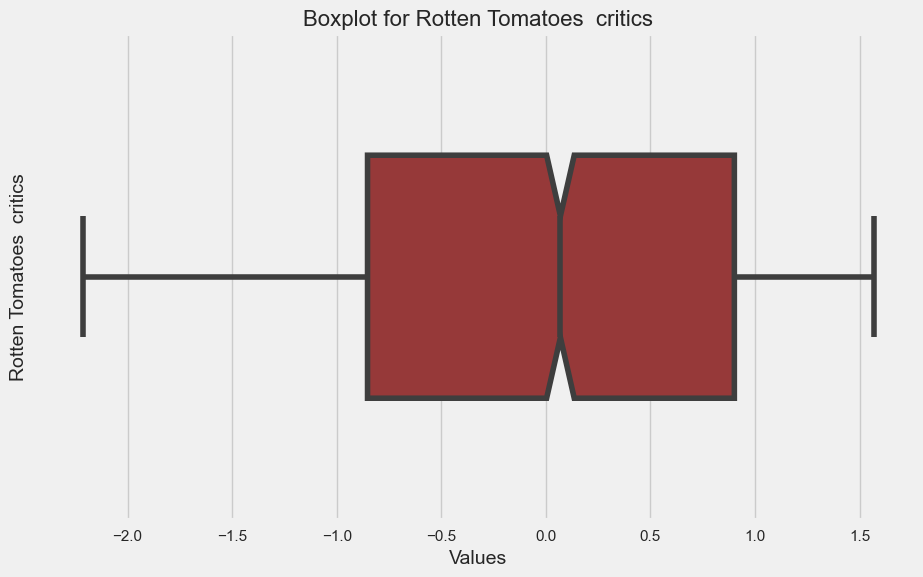

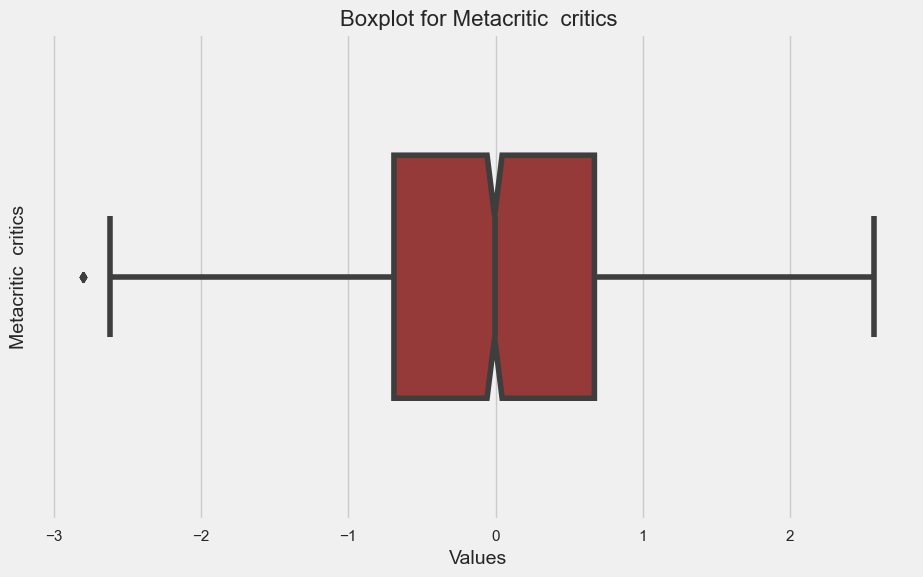

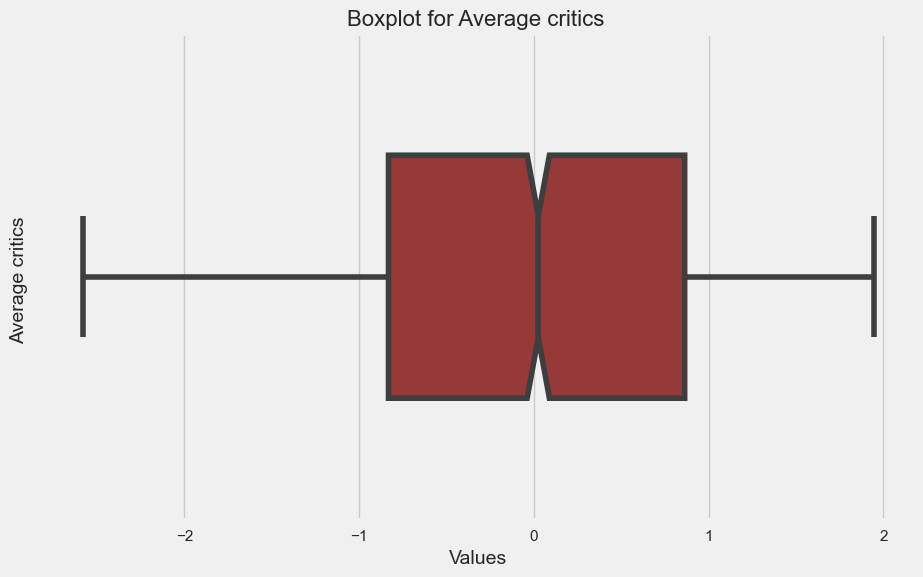

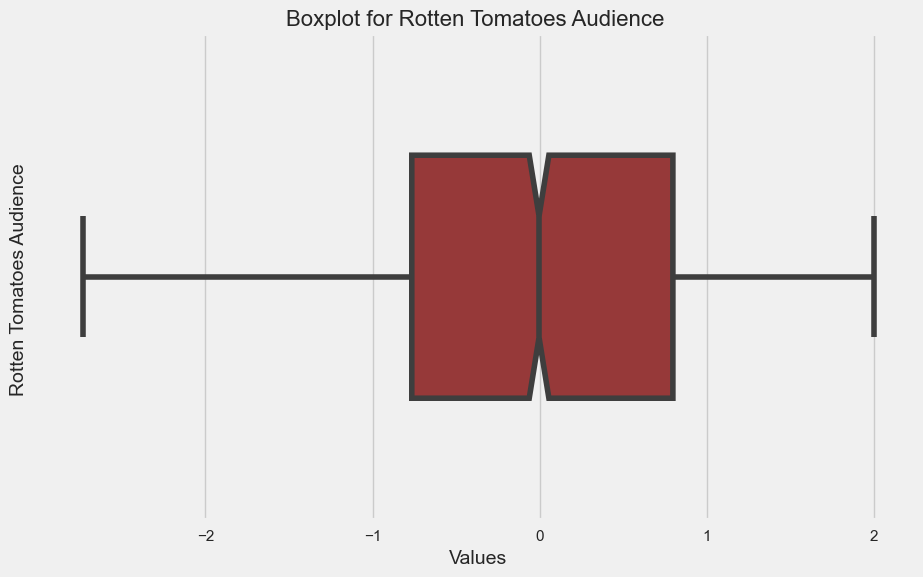

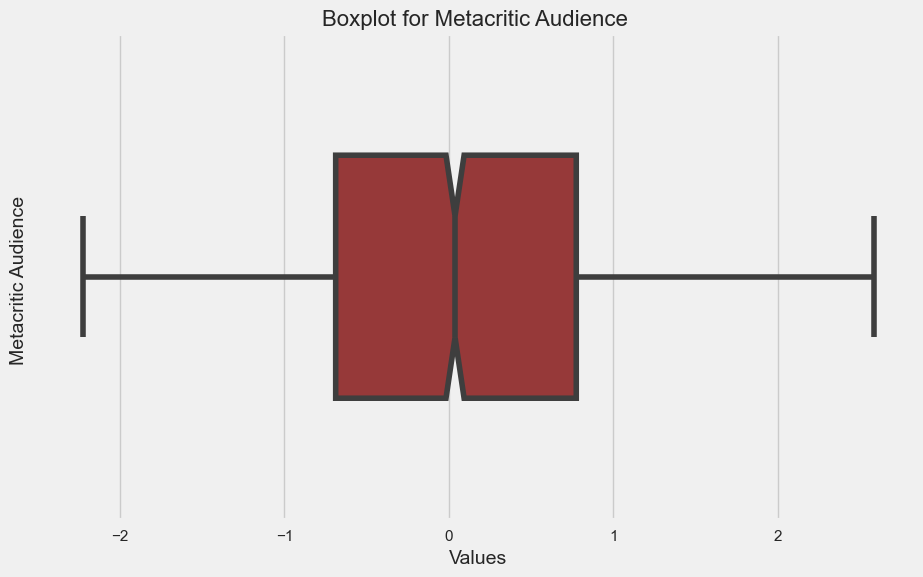

...

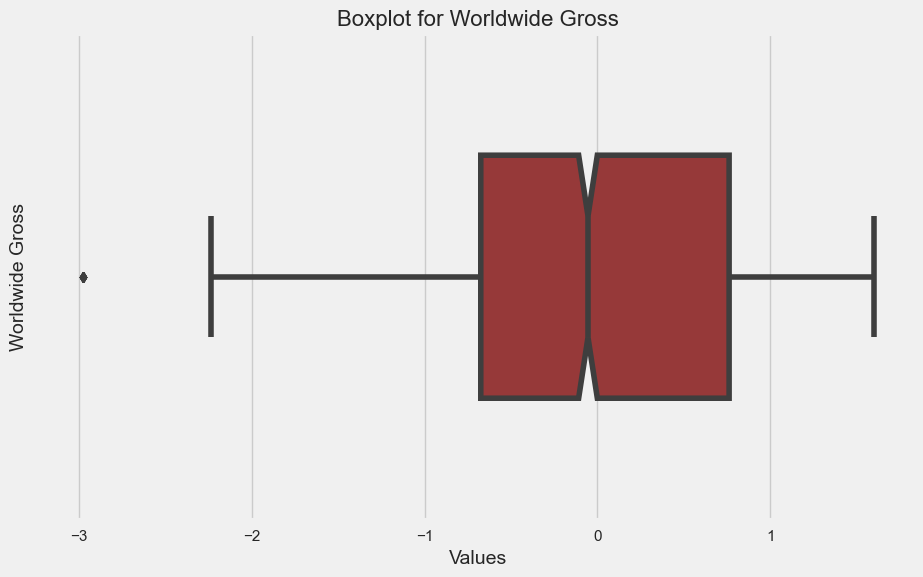

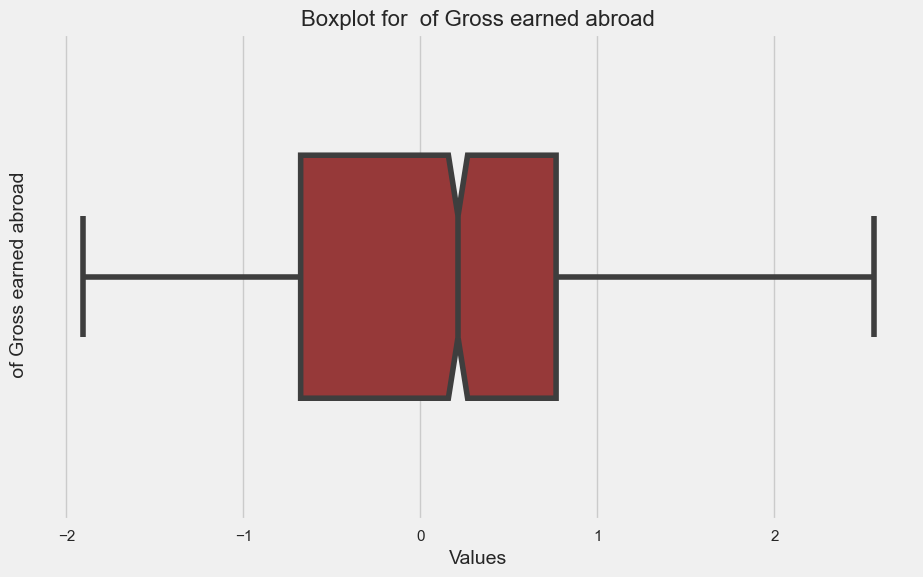

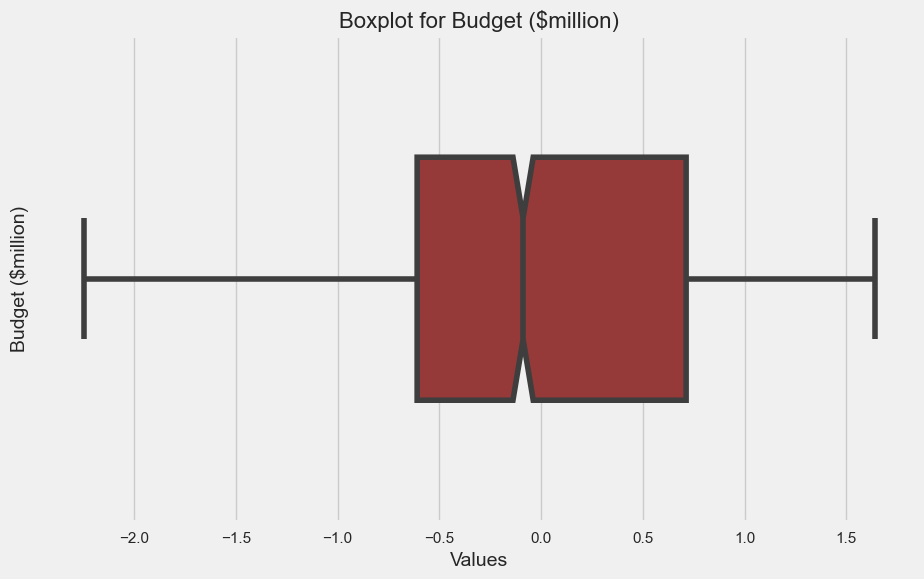

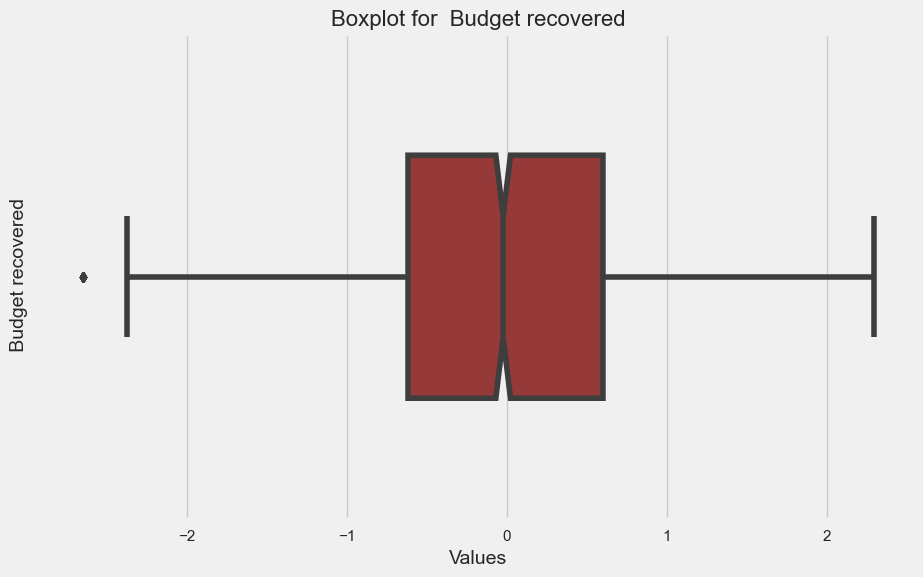

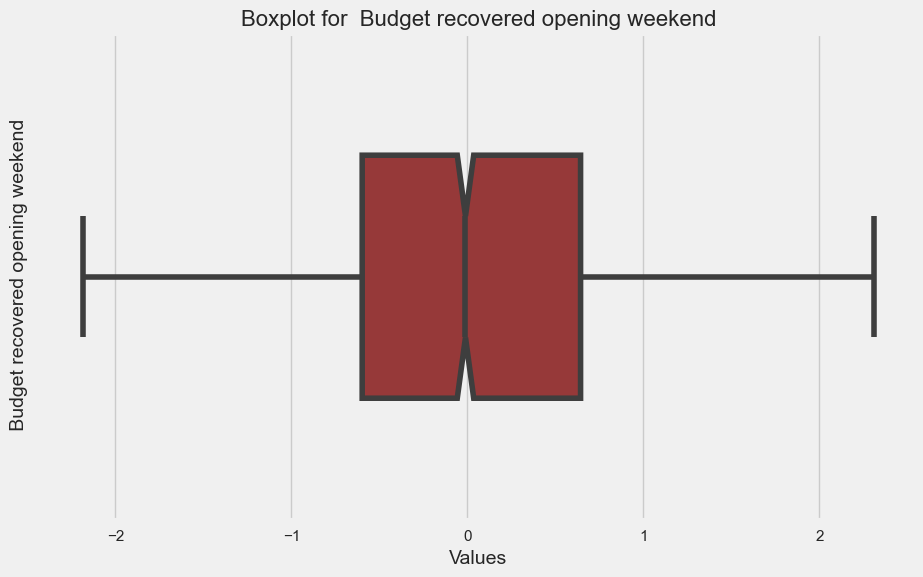

In [45]:
for cols in new_df_num.select_dtypes(float):
  plt.figure(figsize=(10, 6))
  sns.boxplot(x=new_df_num[cols], color='brown', width=0.5, notch=True)
  plt.title(f'Boxplot for {cols}', fontsize=16)
  plt.xlabel('Values', fontsize=14)
  plt.ylabel(cols, fontsize=14)
  plt.show()

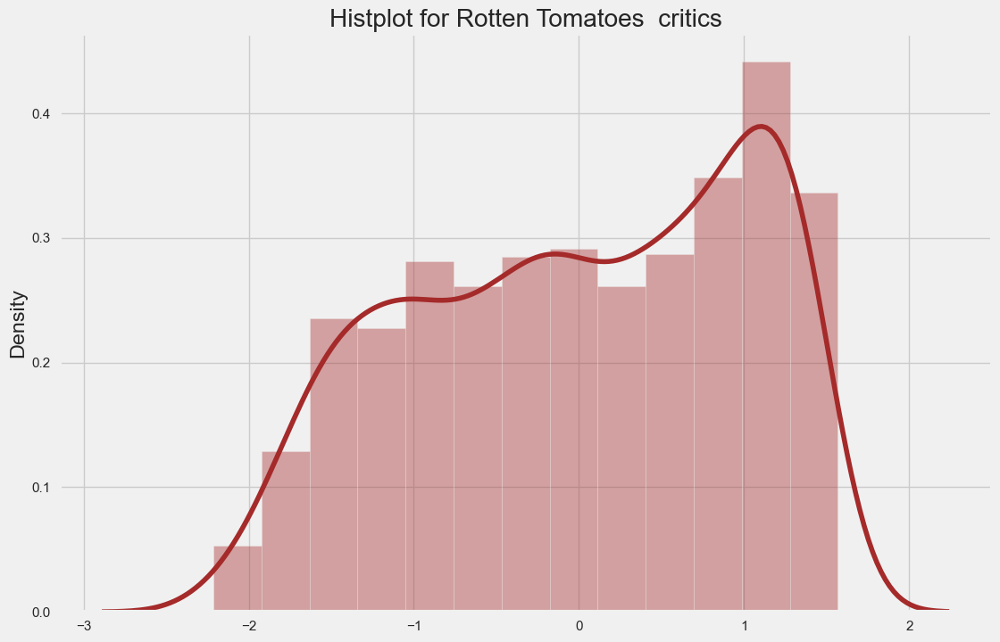

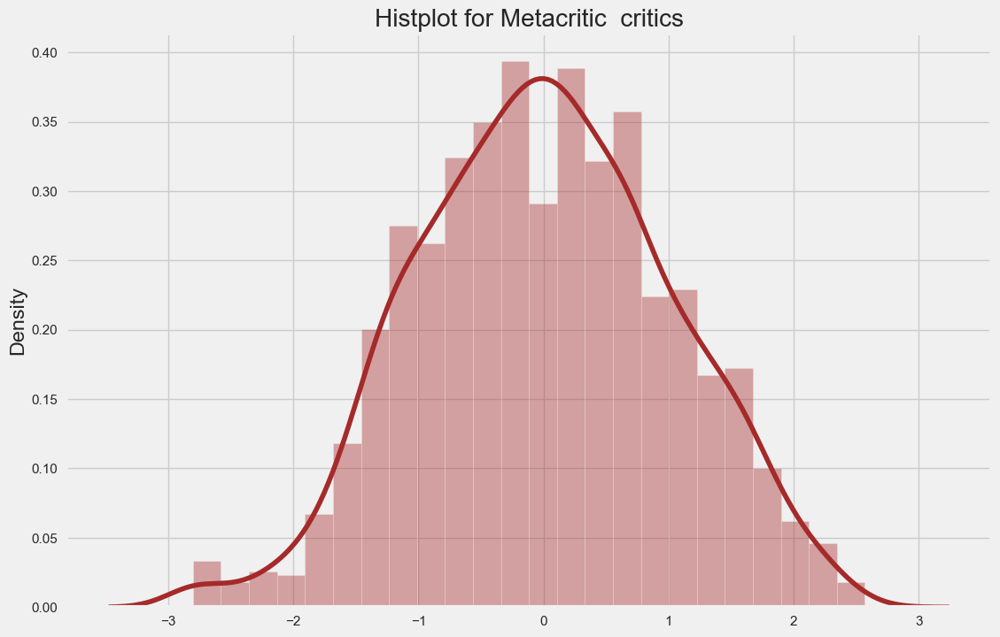

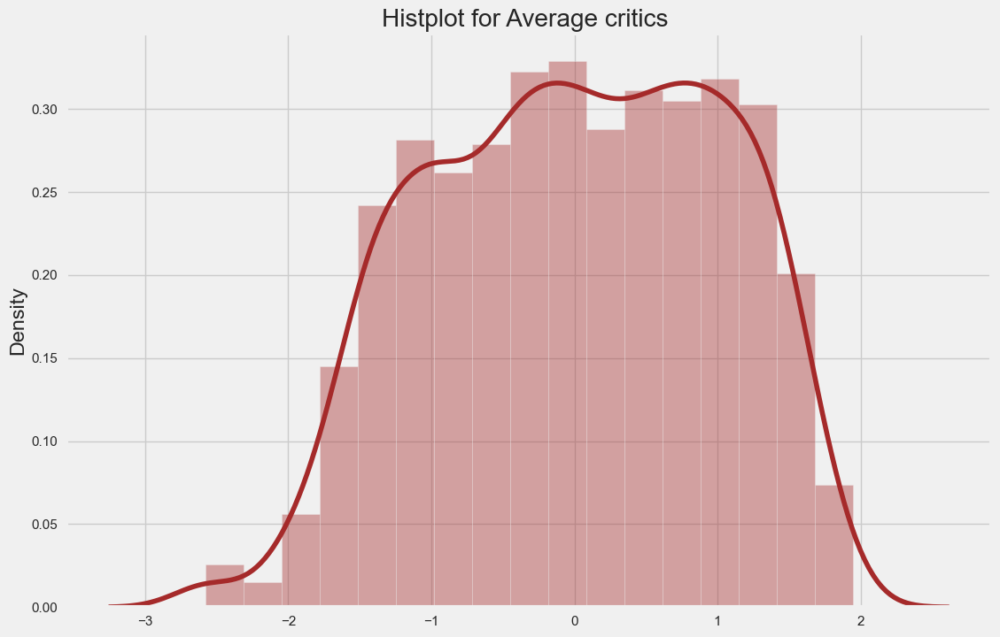

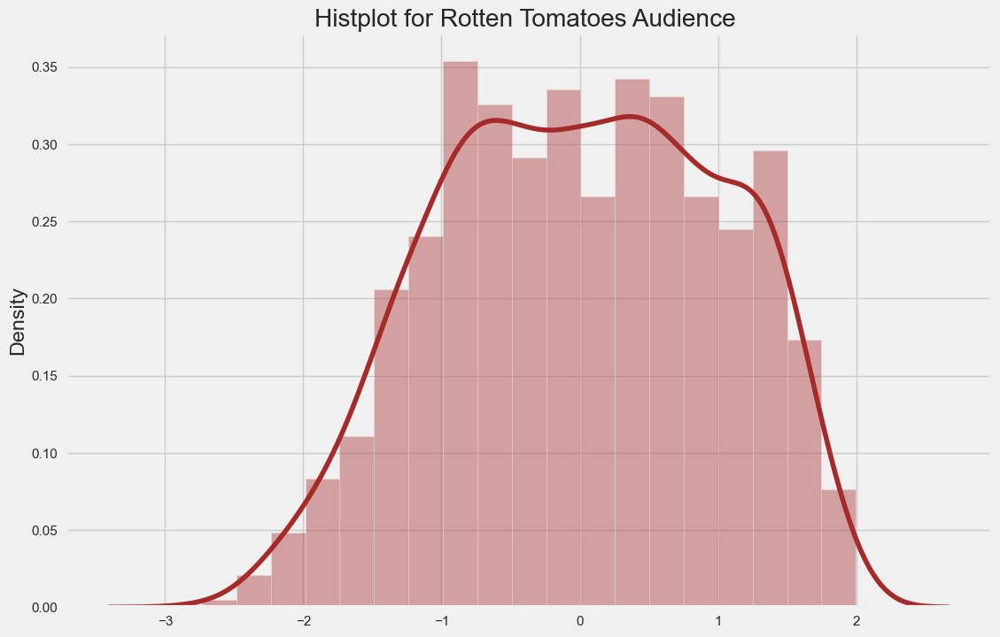

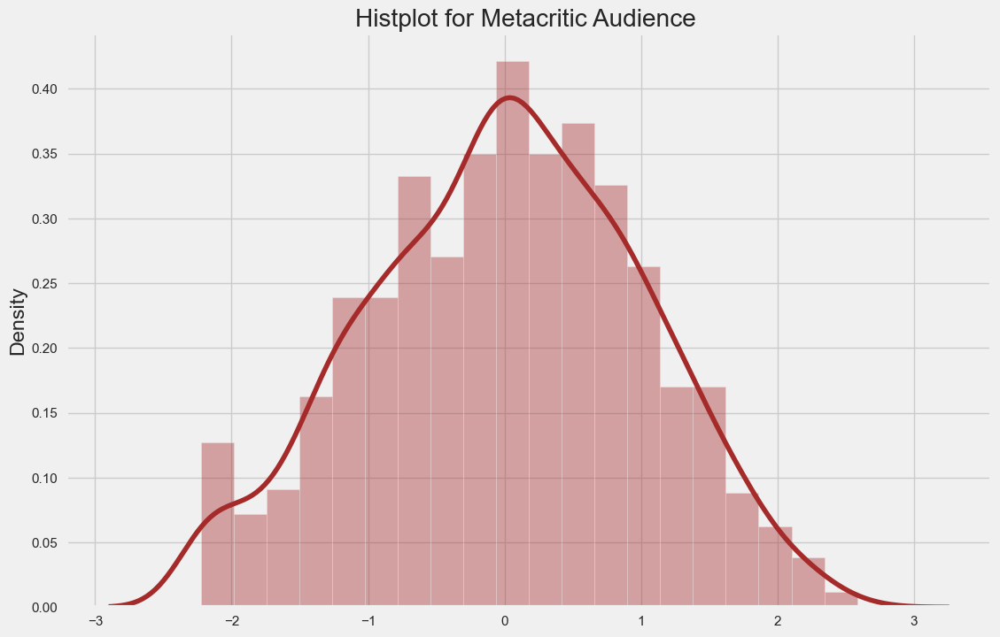

...

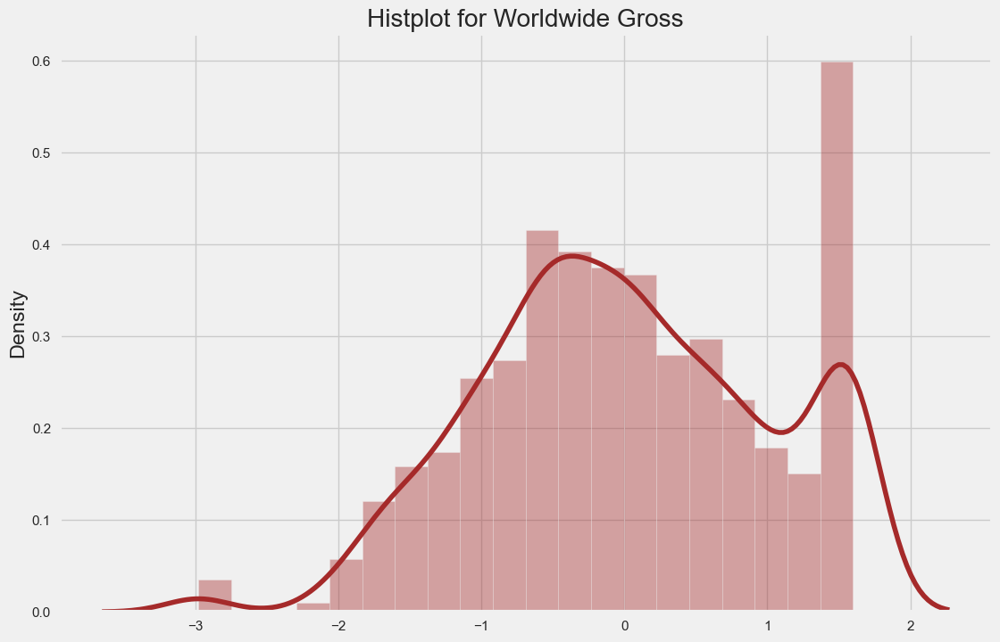

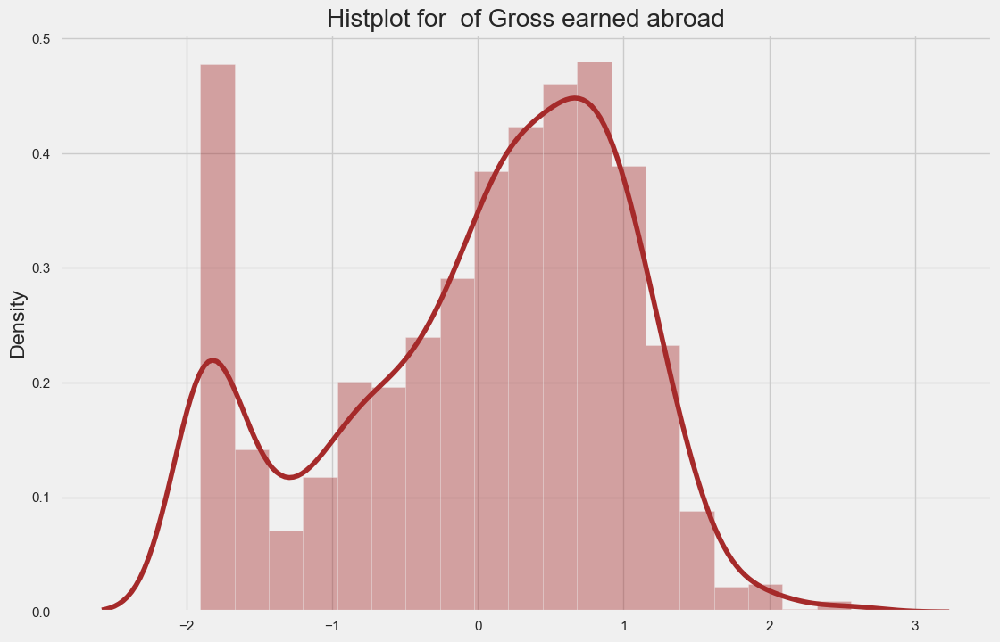

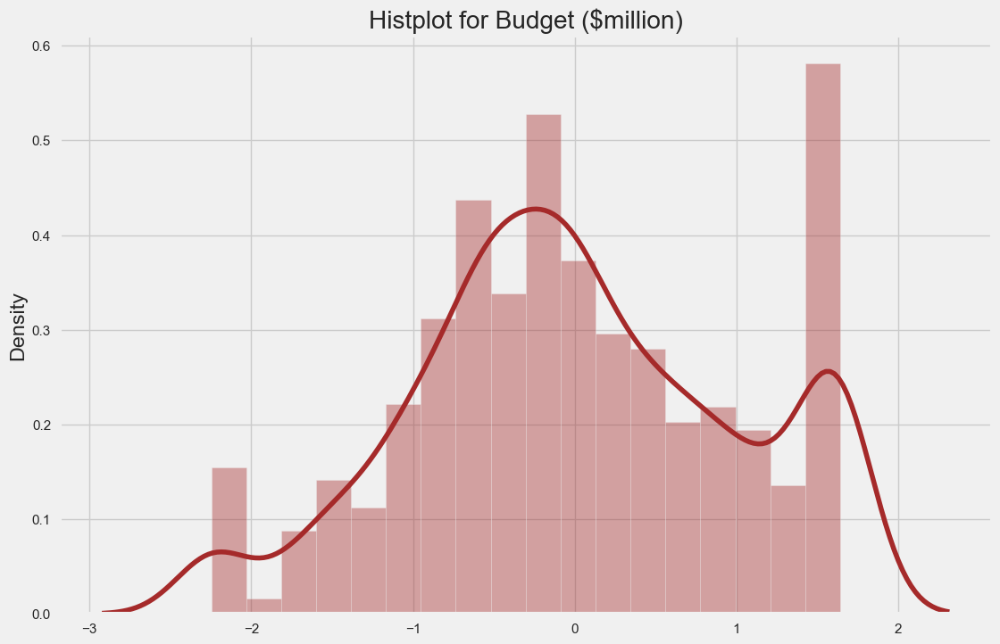

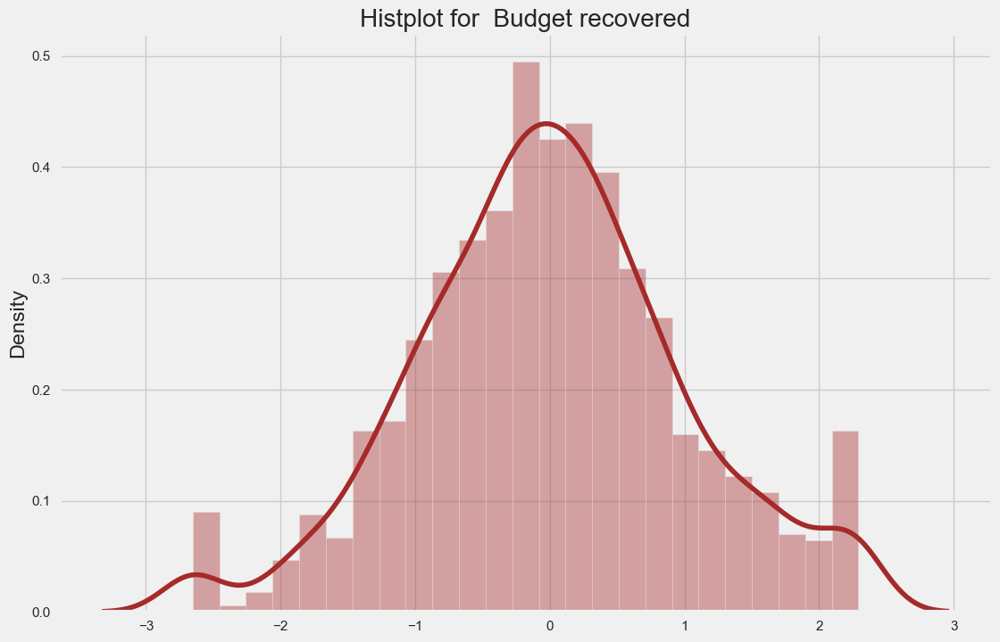

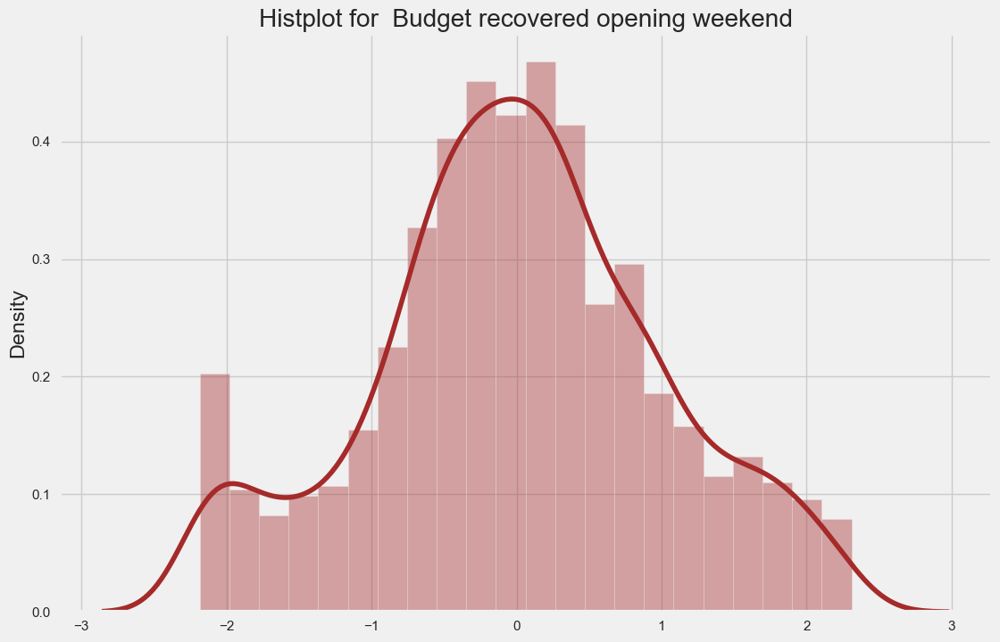

In [46]:
for cols in new_df_num.select_dtypes(float):
    plt.figure(figsize=(12,8))
    sns.distplot(x=new_df_num[cols],color='brown')
    plt.title(f"Histplot for {cols}")
    plt.show()

In [47]:
new_df_cat=new_df.select_dtypes(object)

In [48]:
new_df=pd.concat([new_df_cat,new_df_num],axis=1)

In [49]:
new_df

,Script Type,Genre,Rotten Tomatoes critics,Metacritic critics,Average critics,Rotten Tomatoes Audience,Metacritic Audience,Average audience,Opening Weekend,Domestic Gross,Foreign Gross,Worldwide Gross,of Gross earned abroad,Budget ($million),Budget recovered,Budget recovered opening weekend
0,adaptation,"period, action",0.211137,-0.176681,0.069581,1.388752,0.603640,1.160351,1.657966,1.657210,1.365601,1.598389,0.424182,0.548320,1.706135,1.702846
1,remake,western,1.170331,1.232334,1.211457,1.209194,0.774187,1.160351,0.041745,0.260274,-0.305327,-0.130398,-0.786463,0.264024,-0.603110,-0.235375
2,adaptation,horror,-0.145453,-0.063133,-0.108807,-0.498922,0.115160,-0.233950,0.164202,-0.019360,0.075822,-0.076140,0.177977,-0.170958,-0.026358,0.448823
3,original screenplay,musical,-0.001740,0.106887,0.025063,0.972050,0.774187,1.004446,-0.917741,-0.424203,-0.756745,-0.699268,-1.048494,0.155981,-1.244292,-1.202275
4,sequel,"sci-fi, horror",-1.539590,-1.438725,-1.481932,-1.768346,-1.255532,-1.635131,-0.250471,0.029509,0.604775,0.355938,0.930712,0.039186,0.394375,-0.347676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1669,NaN,NaN,0.968867,0.671233,0.863000,1.569727,-0.190989,0.927273,0.137728,-0.555430,-1.418442,-0.891473,-1.782751,0.933052,-0.174161,1.690542
1678,NaN,NaN,-0.512022,-2.802526,-0.649574,1.090293,-2.226100,1.478314,-0.123196,-1.561581,-2.154333,-2.978054,-1.907136,-2.246955,-0.257125,0.866762
1721,NaN,NaN,1.170331,0.952158,1.124556,0.621391,0.194146,0.475345,0.119830,-0.043513,0.060939,-0.096763,-0.294522,-0.229109,0.349875,0.298336
1722,NaN,NaN,1.203721,1.567624,1.384852,-0.060359,0.774187,0.329016,-0.015725,-0.145351,0.071415,-0.133718,0.093882,0.933052,1.163717,1.339893


In [50]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

In [51]:
ohe=OneHotEncoder(drop='first',sparse=False)

In [52]:
transformed_data=ohe.fit_transform(new_df[['Script Type','Genre']])

In [53]:
columns=ohe.get_feature_names_out(['Script Type','Genre'])

In [54]:
transformed_data_df=pd.DataFrame(transformed_data,columns=columns)

In [55]:
transformed_data_df

,"Script Type_adaptation, based on a true story","Script Type_adaptation, remake / reboot","Script Type_adaptation, sequel",Script Type_based on a true story,Script Type_based on a true story,"Script Type_based on a true story, adaptation","Script Type_based on a true story, remake",Script Type_documentary,Script Type_original screenplay,Script Type_original screenplay,Script Type_prequel,Script Type_remake,Script Type_remake / reboot,"Script Type_remake / reboot, adaptation",Script Type_semi-sequel,Script Type_sequel,Script Type_sequel,"Script Type_sequel, adaptation",Script Type_nan,"Genre_Action, Adventure, Biography, Drama, Thriller, Crime","Genre_Action, Adventure, Drama, Fantasy","Genre_Action, Adventure, Drama, Fantasy, Famiily","Genre_Action, Adventure, Drama, Mystery, Fantasy, Romance","Genre_Action, Adventure, Fantasy","Genre_Action, Adventure, Fantasy, Family","Genre_Action, Adventure, Mystery, Thriller, Fantasy, Comedy, Romance, Animation, Family, Musical","Genre_Action, Adventure, Sci-Fi","Genre_Action, Adventure, Sci-Fi, Drama, Thriller","Genre_Action, Adventure, Sci-Fi, Drama, Thriller, Horror","Genre_Action, Adventure, Sci-Fi, Fantasy","Genre_Action, Adventure, Sci-Fi, Mystery","Genre_Action, Adventure, Sci-Fi, Mystery, Thriller","Genre_Action, Adventure, Sci-Fi, Thriller","Genre_Action, Adventure, Sci-Fi, Thriller, Fantasy","Genre_Action, Adventure, Sci-Fi, Thriller, Romance","Genre_Action, Adventure, Sci-Fi. Thriller","Genre_Action, Adventure, Thriller, Crime","Genre_Action, Adventure, Western","Genre_Action, Biography, Drama, Sport","Genre_Action, Biography, Drama, Thriller, War","Genre_Action, Comedy, Crime","Genre_Action, Drama, Fantasy","Genre_Action, Drama, Mystery, Thriller","Genre_Action, Drama, Thriller","Genre_Action, Drama, Thriller, Comedy, Crime","Genre_Action, Drama, Thriller, Comedy, Crime","Genre_Action, Drama, Thriller, Crime","Genre_Action, Fantasy, Comedy, Crime","Genre_Action, Fantasy, Horro, Comedy","Genre_Action, Sci-Fi, Comedy","Genre_Action, Sci-Fi, Drama, Mystery, Thriller, Crime","Genre_Action, Sci-Fi, Drama, Thriller","Genre_Action, Sci-Fi, Fantasy, Comedy","Genre_Action, Sci-Fi, Thriller","Genre_Action, Thriller","Genre_Action, Thriller, Comedy, Crime","Genre_Action, Thriller, Crime",Genre_Adventure,"Genre_Adventure, Comedy, Animation, Family","Genre_Adventure, Drama, Fantasy, Comedy","Genre_Adventure, Drama, Fantasy, Romance","Genre_Adventure, Fantasy, Comedy, Animation, Family","Genre_Adventure, Sci-Fi, Comedy, Animation, Family","Genre_Adventure, Sci-Fi, Comedy, Crime, Animation, Family","Genre_Adventure, Sport, Comedy, Animation, Family",Genre_Animation,"Genre_Biography, Drama, Comedy, Crime","Genre_Biography, Drama, History","Genre_Biography, Drama, History, Comedy, Music, Family","Genre_Biography, Drama, Sport","Genre_Biography, Drama, Thriller, Romance",Genre_Comedy,"Genre_Comedy, Crime",Genre_Crime,Genre_Drama,"Genre_Drama, Comedy","Genre_Drama, Comedy, Romance","Genre_Drama, Fantasy, Romance","Genre_Drama, History, Thriller, Crime","Genre_Drama, Horror, Comedy, Romance","Genre_Drama, Music","Genre_Drama, Mystery, Thriller, Romance","Genre_Drama, Romance","Genre_Drama, Thriller, Crime","Genre_Drama, War",Genre_Fantasy,"Genre_Fantasy, Comedy, Animation, Family",Genre_Horror,Genre_Musical,"Genre_Mystery, Thriller, Crime","Genre_Sci-Fi, Action","Genre_Sci-Fi, Drama, Comedy, Romance","Genre_Sci-Fi, Drama, Fantasy, Comedy, Romance","Genre_Sci-Fi, Drama, Horro","Genre_Sci-Fi, Drama, Mystery, Thriller","Genre_Sci-Fi, Fantasy, Comedy, Animation, Family","Genre_Sport, Comedy",Genre_Thriller,"Genre_Thriller, Horror, Comedy",Genre_action,"Genre_action, adventure","Genre_action, adventure","Genre_action, adventure,","Genre_action, adventure, biography, drama, history, thriller, comedy, war","Genre_action, adventure, comedy","Genre_action, adventure, crime","Genre_action, adventure, drama","Genre_action, adventure, drama, fantasy","Genre_action, adventure, drama, mystery, thriller, fanta

In [56]:
new_df=pd.concat([new_df,transformed_data_df],axis=1)

In [57]:
new_df.drop(columns=['Script Type','Genre'],inplace=True)

In [58]:
new_df

,Rotten Tomatoes critics,Metacritic critics,Average critics,Rotten Tomatoes Audience,Metacritic Audience,Average audience,Opening Weekend,Domestic Gross,Foreign Gross,Worldwide Gross,of Gross earned abroad,Budget ($million),Budget recovered,Budget recovered opening weekend,"Script Type_adaptation, based on a true story","Script Type_adaptation, remake / reboot","Script Type_adaptation, sequel",Script Type_based on a true story,Script Type_based on a true story,"Script Type_based on a true story, adaptation","Script Type_based on a true story, remake",Script Type_documentary,Script Type_original screenplay,Script Type_original screenplay,Script Type_prequel,Script Type_remake,Script Type_remake / reboot,"Script Type_remake / reboot, adaptation",Script Type_semi-sequel,Script Type_sequel,Script Type_sequel,"Script Type_sequel, adaptation",Script Type_nan,"Genre_Action, Adventure, Biography, Drama, Thriller, Crime","Genre_Action, Adventure, Drama, Fantasy","Genre_Action, Adventure, Drama, Fantasy, Famiily","Genre_Action, Adventure, Drama, Mystery, Fantasy, Romance","Genre_Action, Adventure, Fantasy","Genre_Action, Adventure, Fantasy, Family","Genre_Action, Adventure, Mystery, Thriller, Fantasy, Comedy, Romance, Animation, Family, Musical","Genre_Action, Adventure, Sci-Fi","Genre_Action, Adventure, Sci-Fi, Drama, Thriller","Genre_Action, Adventure, Sci-Fi, Drama, Thriller, Horror","Genre_Action, Adventure, Sci-Fi, Fantasy","Genre_Action, Adventure, Sci-Fi, Mystery","Genre_Action, Adventure, Sci-Fi, Mystery, Thriller","Genre_Action, Adventure, Sci-Fi, Thriller","Genre_Action, Adventure, Sci-Fi, Thriller, Fantasy","Genre_Action, Adventure, Sci-Fi, Thriller, Romance","Genre_Action, Adventure, Sci-Fi. Thriller","Genre_Action, Adventure, Thriller, Crime","Genre_Action, Adventure, Western","Genre_Action, Biography, Drama, Sport","Genre_Action, Biography, Drama, Thriller, War","Genre_Action, Comedy, Crime","Genre_Action, Drama, Fantasy","Genre_Action, Drama, Mystery, Thriller","Genre_Action, Drama, Thriller","Genre_Action, Drama, Thriller, Comedy, Crime","Genre_Action, Drama, Thriller, Comedy, Crime","Genre_Action, Drama, Thriller, Crime","Genre_Action, Fantasy, Comedy, Crime","Genre_Action, Fantasy, Horro, Comedy","Genre_Action, Sci-Fi, Comedy","Genre_Action, Sci-Fi, Drama, Mystery, Thriller, Crime","Genre_Action, Sci-Fi, Drama, Thriller","Genre_Action, Sci-Fi, Fantasy, Comedy","Genre_Action, Sci-Fi, Thriller","Genre_Action, Thriller","Genre_Action, Thriller, Comedy, Crime","Genre_Action, Thriller, Crime",Genre_Adventure,"Genre_Adventure, Comedy, Animation, Family","Genre_Adventure, Drama, Fantasy, Comedy","Genre_Adventure, Drama, Fantasy, Romance","Genre_Adventure, Fantasy, Comedy, Animation, Family","Genre_Adventure, Sci-Fi, Comedy, Animation, Family","Genre_Adventure, Sci-Fi, Comedy, Crime, Animation, Family","Genre_Adventure, Sport, Comedy, Animation, Family",Genre_Animation,"Genre_Biography, Drama, Comedy, Crime","Genre_Biography, Drama, History","Genre_Biography, Drama, History, Comedy, Music, Family","Genre_Biography, Drama, Sport","Genre_Biography, Drama, Thriller, Romance",Genre_Comedy,"Genre_Comedy, Crime",Genre_Crime,Genre_Drama,"Genre_Drama, Comedy","Genre_Drama, Comedy, Romance","Genre_Drama, Fantasy, Romance","Genre_Drama, History, Thriller, Crime","Genre_Drama, Horror, Comedy, Romance","Genre_Drama, Music","Genre_Drama, Mystery, Thriller, Romance","Genre_Drama, Romance","Genre_Drama, Thriller, Crime","Genre_Drama, War",Genre_Fantasy,"Genre_Fantasy, Comedy, Animation, Family",Genre_Horror,Genre_Musical,"Genre_Mystery, Thriller, Crime","Genre_Sci-Fi, Action","Genre_Sci-Fi, Drama, Comedy, Romance","Genre_Sci-Fi, Drama, Fantasy, Comedy, Romance","Genre_Sci-Fi, Drama, Horro","Genre_Sci-Fi, Drama, Mystery, Thriller","Genre_Sci-Fi, Fantasy, Comedy, Animation, Family","Genre_Sport, Comedy",Genre_Thriller,"Genre_Thriller, Horror, Comedy",Genre_action,"Genre_action, adventure","Genre_action, adventure","Genre_action, adventure,","G

In [59]:
new_df.dropna(inplace=True)

In [60]:
new_df

,Rotten Tomatoes critics,Metacritic critics,Average critics,Rotten Tomatoes Audience,Metacritic Audience,Average audience,Opening Weekend,Domestic Gross,Foreign Gross,Worldwide Gross,of Gross earned abroad,Budget ($million),Budget recovered,Budget recovered opening weekend,"Script Type_adaptation, based on a true story","Script Type_adaptation, remake / reboot","Script Type_adaptation, sequel",Script Type_based on a true story,Script Type_based on a true story,"Script Type_based on a true story, adaptation","Script Type_based on a true story, remake",Script Type_documentary,Script Type_original screenplay,Script Type_original screenplay,Script Type_prequel,Script Type_remake,Script Type_remake / reboot,"Script Type_remake / reboot, adaptation",Script Type_semi-sequel,Script Type_sequel,Script Type_sequel,"Script Type_sequel, adaptation",Script Type_nan,"Genre_Action, Adventure, Biography, Drama, Thriller, Crime","Genre_Action, Adventure, Drama, Fantasy","Genre_Action, Adventure, Drama, Fantasy, Famiily","Genre_Action, Adventure, Drama, Mystery, Fantasy, Romance","Genre_Action, Adventure, Fantasy","Genre_Action, Adventure, Fantasy, Family","Genre_Action, Adventure, Mystery, Thriller, Fantasy, Comedy, Romance, Animation, Family, Musical","Genre_Action, Adventure, Sci-Fi","Genre_Action, Adventure, Sci-Fi, Drama, Thriller","Genre_Action, Adventure, Sci-Fi, Drama, Thriller, Horror","Genre_Action, Adventure, Sci-Fi, Fantasy","Genre_Action, Adventure, Sci-Fi, Mystery","Genre_Action, Adventure, Sci-Fi, Mystery, Thriller","Genre_Action, Adventure, Sci-Fi, Thriller","Genre_Action, Adventure, Sci-Fi, Thriller, Fantasy","Genre_Action, Adventure, Sci-Fi, Thriller, Romance","Genre_Action, Adventure, Sci-Fi. Thriller","Genre_Action, Adventure, Thriller, Crime","Genre_Action, Adventure, Western","Genre_Action, Biography, Drama, Sport","Genre_Action, Biography, Drama, Thriller, War","Genre_Action, Comedy, Crime","Genre_Action, Drama, Fantasy","Genre_Action, Drama, Mystery, Thriller","Genre_Action, Drama, Thriller","Genre_Action, Drama, Thriller, Comedy, Crime","Genre_Action, Drama, Thriller, Comedy, Crime","Genre_Action, Drama, Thriller, Crime","Genre_Action, Fantasy, Comedy, Crime","Genre_Action, Fantasy, Horro, Comedy","Genre_Action, Sci-Fi, Comedy","Genre_Action, Sci-Fi, Drama, Mystery, Thriller, Crime","Genre_Action, Sci-Fi, Drama, Thriller","Genre_Action, Sci-Fi, Fantasy, Comedy","Genre_Action, Sci-Fi, Thriller","Genre_Action, Thriller","Genre_Action, Thriller, Comedy, Crime","Genre_Action, Thriller, Crime",Genre_Adventure,"Genre_Adventure, Comedy, Animation, Family","Genre_Adventure, Drama, Fantasy, Comedy","Genre_Adventure, Drama, Fantasy, Romance","Genre_Adventure, Fantasy, Comedy, Animation, Family","Genre_Adventure, Sci-Fi, Comedy, Animation, Family","Genre_Adventure, Sci-Fi, Comedy, Crime, Animation, Family","Genre_Adventure, Sport, Comedy, Animation, Family",Genre_Animation,"Genre_Biography, Drama, Comedy, Crime","Genre_Biography, Drama, History","Genre_Biography, Drama, History, Comedy, Music, Family","Genre_Biography, Drama, Sport","Genre_Biography, Drama, Thriller, Romance",Genre_Comedy,"Genre_Comedy, Crime",Genre_Crime,Genre_Drama,"Genre_Drama, Comedy","Genre_Drama, Comedy, Romance","Genre_Drama, Fantasy, Romance","Genre_Drama, History, Thriller, Crime","Genre_Drama, Horror, Comedy, Romance","Genre_Drama, Music","Genre_Drama, Mystery, Thriller, Romance","Genre_Drama, Romance","Genre_Drama, Thriller, Crime","Genre_Drama, War",Genre_Fantasy,"Genre_Fantasy, Comedy, Animation, Family",Genre_Horror,Genre_Musical,"Genre_Mystery, Thriller, Crime","Genre_Sci-Fi, Action","Genre_Sci-Fi, Drama, Comedy, Romance","Genre_Sci-Fi, Drama, Fantasy, Comedy, Romance","Genre_Sci-Fi, Drama, Horro","Genre_Sci-Fi, Drama, Mystery, Thriller","Genre_Sci-Fi, Fantasy, Comedy, Animation, Family","Genre_Sport, Comedy",Genre_Thriller,"Genre_Thriller, Horror, Comedy",Genre_action,"Genre_action, adventure","Genre_action, adventure","Genre_action, adventure,","G

In [62]:
from sklearn.model_selection import train_test_split

In [63]:
X=new_df.drop('Average critics ',axis=1)

In [64]:
y=new_df['Average critics ']

In [65]:
X

,Rotten Tomatoes critics,Metacritic critics,Rotten Tomatoes Audience,Metacritic Audience,Average audience,Opening Weekend,Domestic Gross,Foreign Gross,Worldwide Gross,of Gross earned abroad,Budget ($million),Budget recovered,Budget recovered opening weekend,"Script Type_adaptation, based on a true story","Script Type_adaptation, remake / reboot","Script Type_adaptation, sequel",Script Type_based on a true story,Script Type_based on a true story,"Script Type_based on a true story, adaptation","Script Type_based on a true story, remake",Script Type_documentary,Script Type_original screenplay,Script Type_original screenplay,Script Type_prequel,Script Type_remake,Script Type_remake / reboot,"Script Type_remake / reboot, adaptation",Script Type_semi-sequel,Script Type_sequel,Script Type_sequel,"Script Type_sequel, adaptation",Script Type_nan,"Genre_Action, Adventure, Biography, Drama, Thriller, Crime","Genre_Action, Adventure, Drama, Fantasy","Genre_Action, Adventure, Drama, Fantasy, Famiily","Genre_Action, Adventure, Drama, Mystery, Fantasy, Romance","Genre_Action, Adventure, Fantasy","Genre_Action, Adventure, Fantasy, Family","Genre_Action, Adventure, Mystery, Thriller, Fantasy, Comedy, Romance, Animation, Family, Musical","Genre_Action, Adventure, Sci-Fi","Genre_Action, Adventure, Sci-Fi, Drama, Thriller","Genre_Action, Adventure, Sci-Fi, Drama, Thriller, Horror","Genre_Action, Adventure, Sci-Fi, Fantasy","Genre_Action, Adventure, Sci-Fi, Mystery","Genre_Action, Adventure, Sci-Fi, Mystery, Thriller","Genre_Action, Adventure, Sci-Fi, Thriller","Genre_Action, Adventure, Sci-Fi, Thriller, Fantasy","Genre_Action, Adventure, Sci-Fi, Thriller, Romance","Genre_Action, Adventure, Sci-Fi. Thriller","Genre_Action, Adventure, Thriller, Crime","Genre_Action, Adventure, Western","Genre_Action, Biography, Drama, Sport","Genre_Action, Biography, Drama, Thriller, War","Genre_Action, Comedy, Crime","Genre_Action, Drama, Fantasy","Genre_Action, Drama, Mystery, Thriller","Genre_Action, Drama, Thriller","Genre_Action, Drama, Thriller, Comedy, Crime","Genre_Action, Drama, Thriller, Comedy, Crime","Genre_Action, Drama, Thriller, Crime","Genre_Action, Fantasy, Comedy, Crime","Genre_Action, Fantasy, Horro, Comedy","Genre_Action, Sci-Fi, Comedy","Genre_Action, Sci-Fi, Drama, Mystery, Thriller, Crime","Genre_Action, Sci-Fi, Drama, Thriller","Genre_Action, Sci-Fi, Fantasy, Comedy","Genre_Action, Sci-Fi, Thriller","Genre_Action, Thriller","Genre_Action, Thriller, Comedy, Crime","Genre_Action, Thriller, Crime",Genre_Adventure,"Genre_Adventure, Comedy, Animation, Family","Genre_Adventure, Drama, Fantasy, Comedy","Genre_Adventure, Drama, Fantasy, Romance","Genre_Adventure, Fantasy, Comedy, Animation, Family","Genre_Adventure, Sci-Fi, Comedy, Animation, Family","Genre_Adventure, Sci-Fi, Comedy, Crime, Animation, Family","Genre_Adventure, Sport, Comedy, Animation, Family",Genre_Animation,"Genre_Biography, Drama, Comedy, Crime","Genre_Biography, Drama, History","Genre_Biography, Drama, History, Comedy, Music, Family","Genre_Biography, Drama, Sport","Genre_Biography, Drama, Thriller, Romance",Genre_Comedy,"Genre_Comedy, Crime",Genre_Crime,Genre_Drama,"Genre_Drama, Comedy","Genre_Drama, Comedy, Romance","Genre_Drama, Fantasy, Romance","Genre_Drama, History, Thriller, Crime","Genre_Drama, Horror, Comedy, Romance","Genre_Drama, Music","Genre_Drama, Mystery, Thriller, Romance","Genre_Drama, Romance","Genre_Drama, Thriller, Crime","Genre_Drama, War",Genre_Fantasy,"Genre_Fantasy, Comedy, Animation, Family",Genre_Horror,Genre_Musical,"Genre_Mystery, Thriller, Crime","Genre_Sci-Fi, Action","Genre_Sci-Fi, Drama, Comedy, Romance","Genre_Sci-Fi, Drama, Fantasy, Comedy, Romance","Genre_Sci-Fi, Drama, Horro","Genre_Sci-Fi, Drama, Mystery, Thriller","Genre_Sci-Fi, Fantasy, Comedy, Animation, Family","Genre_Sport, Comedy",Genre_Thriller,"Genre_Thriller, Horror, Comedy",Genre_action,"Genre_action, adventure","Genre_action, adventure","Genre_action, adventure,","Genre_action, adv

In [66]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=2)

In [67]:
from sklearn.ensemble import RandomForestRegressor

In [68]:
rfc=RandomForestRegressor()

In [69]:
rfc.fit(X_train,y_train)

RandomForestRegressor()

In [70]:
y_pred=rfc.predict(X_test)

In [71]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

In [72]:
print("Mean Squared Error is ",mean_squared_error(y_test,y_pred))
print("Mean Absolute Error is ",mean_absolute_error(y_test,y_pred))
print("R2 Score is ",r2_score(y_test,y_pred))

Mean Squared Error is  0.004448443275485656
Mean Absolute Error is  0.026260767160136648
R2 Score is  0.9955949125930575


In [73]:
rf_pred=pd.DataFrame()
rf_pred['Actual']=y_test

In [74]:
rf_pred['Predicted']=y_pred

In [75]:
y_test

1384    0.423968
472     0.906685
974     0.114048
1438   -0.153538
404     0.291426
474     0.468059
1677    0.731716
61      1.514556
1055   -1.015733
1685    0.069581
635    -0.064130
886     0.950332
254    -1.061885
1728   -0.019507
1131   -1.840252
671    -0.333038
978    -0.923699
1307   -1.015733
1333   -1.387784
525    -1.864495
1643   -1.061885
1400   -1.529204
281    -0.604152
803     0.158465
126    -1.624176
1304    0.950332
704    -0.064130
919     0.247153
1666    0.950332
1421   -0.153538
1143   -1.695809
986     1.600869
1583    1.471353
350     1.211457
629     0.687876
623     1.254856
1137   -1.624176
516    -0.832007
1262   -2.011133
117     0.643995
1516    0.906685
158    -1.015733
1576   -0.513517
180    -0.333038
602    -0.604152
402     0.512107
1123    0.025063
1543    0.819277
849    -0.153538
1118   -2.011133
1170   -0.740638
88      1.514556
96      0.775516
486     0.950332
1567    1.471353
1115    0.556112
161    -0.649574
527    -1.108131
1559   -0.8778

In [76]:
rf_pred

,Actual,Predicted
1384,0.423968,0.550778
472,0.906685,0.919762
974,0.114048,0.102895
1438,-0.153538,-0.139246
404,0.291426,0.340269
474,0.468059,0.442039
1677,0.731716,0.709558
61,1.514556,1.517570
1055,-1.015733,-0.956692
1685,0.069581,-0.020647


<Axes: >

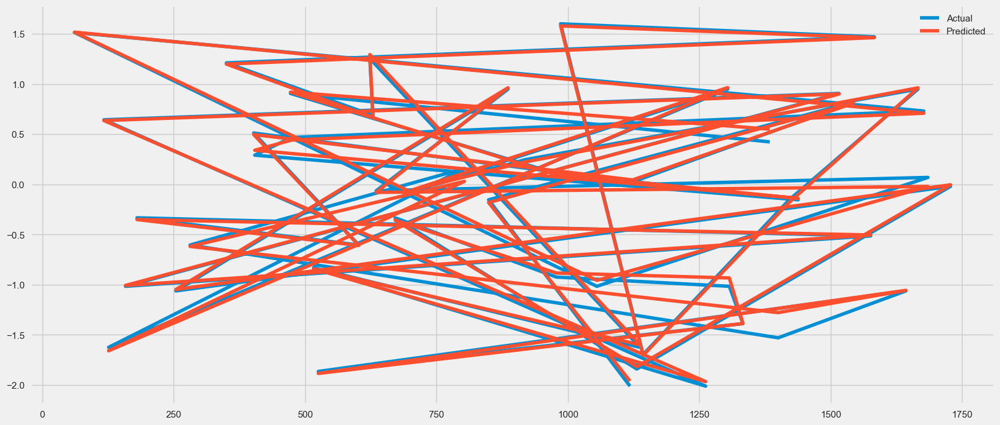

In [77]:
rf_pred.head(50).plot(figsize=(18,8))

In [78]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

In [79]:
cv = KFold(n_splits=5, shuffle=True, random_state=42)

In [84]:
model=RandomForestRegressor()
mse_scores = cross_val_score(model, X, y, cv=cv, scoring='neg_mean_squared_error')
mae_scores = cross_val_score(model, X, y, cv=cv, scoring='neg_mean_absolute_error')
r2_scores = cross_val_score(model, X, y, cv=cv, scoring='r2')

In [85]:
print("Cross-validated MSE Scores:", mse_scores)
print("Mean MSE:", np.mean(mse_scores))

Cross-validated MSE Scores: [-0.01891748 -0.00831318 -0.00838042 -0.00212253 -0.01690903]
Mean MSE: -0.010928528973475848


In [86]:
print("Cross-validated MAE Scores:", mae_scores)
print("Mean MAE:", np.mean(mae_scores))

Cross-validated MAE Scores: [-0.03051026 -0.02738785 -0.02955977 -0.02144891 -0.02919091]
Mean MAE: -0.027619537818061167


In [87]:
print("Cross-validated R2 Scores:", r2_scores)
print("Mean R2:", np.mean(r2_scores))

Cross-validated R2 Scores: [0.98299679 0.99247893 0.99084112 0.99813961 0.9818123 ]
Mean R2: 0.9892537497658556
